In [1]:
 import pandas as pd
import numpy as np
import os

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from scipy.stats import f_oneway

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

import seaborn as sns

In [2]:
from google.colab import drive

# Montez Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
application_train = pd.read_csv("/content/drive/My Drive/IAEngineer/IAEngineer/P4/application_train.csv")

# Exploration des données

In [4]:
application_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [5]:
application_train.columns.tolist()

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_A

In [6]:
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
application_train['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

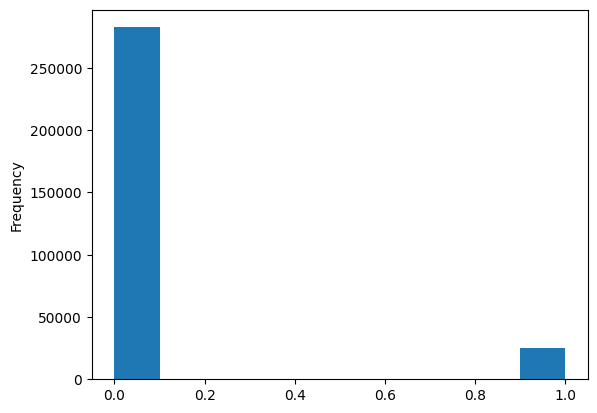

In [8]:
application_train['TARGET'].astype(int).plot.hist();

In [9]:
# Fonction pour calculer le nombre de valeurs manquantes
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()

        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)

        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})

        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)

        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")

        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [10]:
# Missing values statistics
missing_values = missing_values_table(application_train)
missing_values.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


application_train.dtypes.value_counts()

In [11]:
application_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

# Choix des variables

Parmi les données que le métier souhaite étudier dans le remboursement des

In [12]:
from sklearn.preprocessing import LabelEncoder

# Créer un objet LabelEncoder
le = LabelEncoder()
application_train['NAME_CONTRACT_TYPE'] = le.fit_transform(application_train['NAME_CONTRACT_TYPE'])

In [13]:
# Sélectionner les colonnes à encoder
columns_to_encode = ['CODE_GENDER', 'NAME_INCOME_TYPE']

# Appliquer le One Hot Encoding aux colonnes sélectionnées
application_train = pd.get_dummies(application_train, columns=columns_to_encode)

print('Training Features shape: ', application_train.shape)

Training Features shape:  (307511, 131)


In [14]:
application_train.dtypes.value_counts()

float64    65
int64      42
object     13
uint8      11
dtype: int64

In [15]:
application_train.columns.tolist()

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA

In [16]:
application_train.rename(columns={'NAME_INCOME_TYPE_Commercial associate': 'NAME_INCOME_TYPE_Commercial_associate'}, inplace=True)
application_train.rename(columns={'NAME_INCOME_TYPE_Maternity leave': 'NAME_INCOME_TYPE_Maternity_leave'}, inplace=True)
application_train.rename(columns={'NAME_INCOME_TYPE_State servant': 'NAME_INCOME_TYPE_State_servant'}, inplace=True)

In [17]:
application_train.columns.tolist()

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA

In [18]:
(application_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [19]:
Selected_variables=['DAYS_BIRTH','DAYS_EMPLOYED','AMT_CREDIT', 'AMT_INCOME_TOTAL', 'AMT_ANNUITY','CODE_GENDER_F','CODE_GENDER_M','CODE_GENDER_XNA','NAME_INCOME_TYPE_Businessman','NAME_INCOME_TYPE_Commercial_associate','NAME_INCOME_TYPE_Maternity_leave','NAME_INCOME_TYPE_Pensioner','NAME_INCOME_TYPE_State_servant','NAME_INCOME_TYPE_Student','NAME_INCOME_TYPE_Unemployed','NAME_INCOME_TYPE_Working']
application_train[Selected_variables].describe()

,DAYS_BIRTH,DAYS_EMPLOYED,AMT_CREDIT,AMT_INCOME_TOTAL,AMT_ANNUITY,CODE_GENDER_F,CODE_GENDER_M,CODE_GENDER_XNA,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial_associate,NAME_INCOME_TYPE_Maternity_leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State_servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working
count,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,-16036.995067,63815.045904,5.990260e+05,1.687979e+05,27108.573909,0.658344,0.341643,0.000013,0.000033,0.232892,0.000016,0.180033,0.070576,0.000059,0.000072,0.516320
std,4363.988632,141275.766519,4.024908e+05,2.371231e+05,14493.737315,0.474266,0.474261,0.003607,0.005702,0.422675,0.004032,0.384215,0.256116,0.007651,0.008458,0.499734
min,-25229.000000,-17912.000000,4.500000e+04,2.565000e+04,1615.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-19682.000000,-2760.000000,2.700000e+05,1.125000e+05,16524.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-15750.000000,-1213.000000,5.135310e+05,1.471500e+05,24903.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,-12413.000000,-289.000000,8.086500e+05,2.025000e+05,34596.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,-7489.000000,365243.000000,4.050000e+06,1.170000e+08,258025.500000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


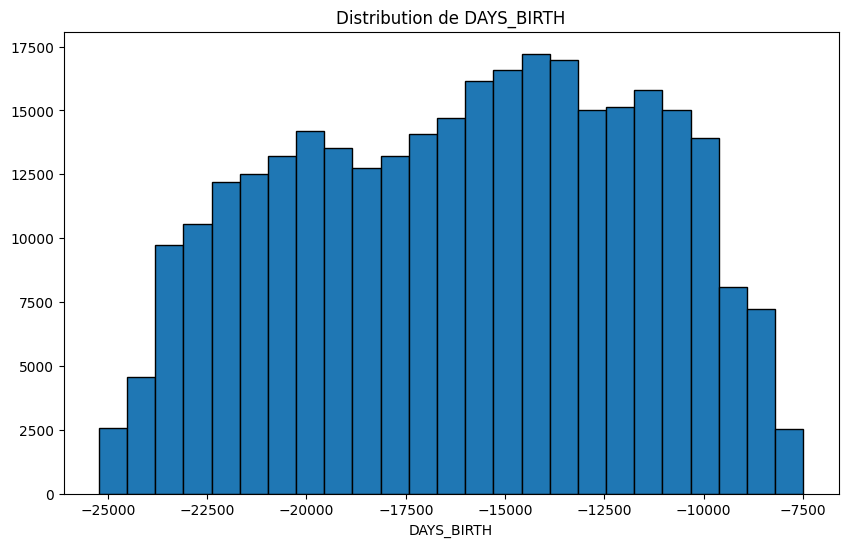

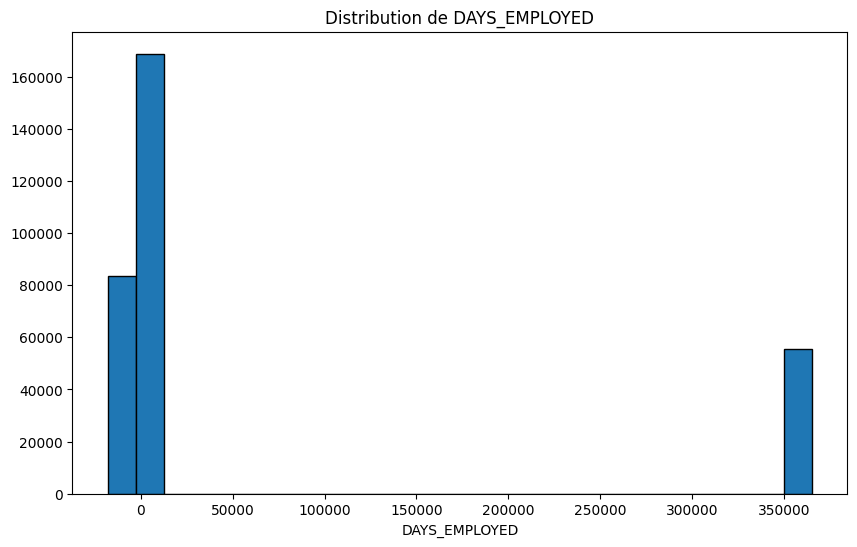

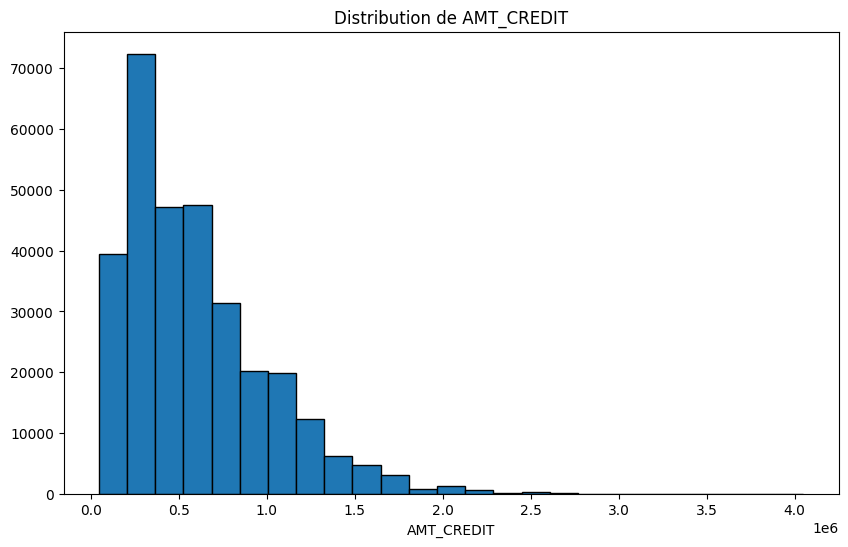

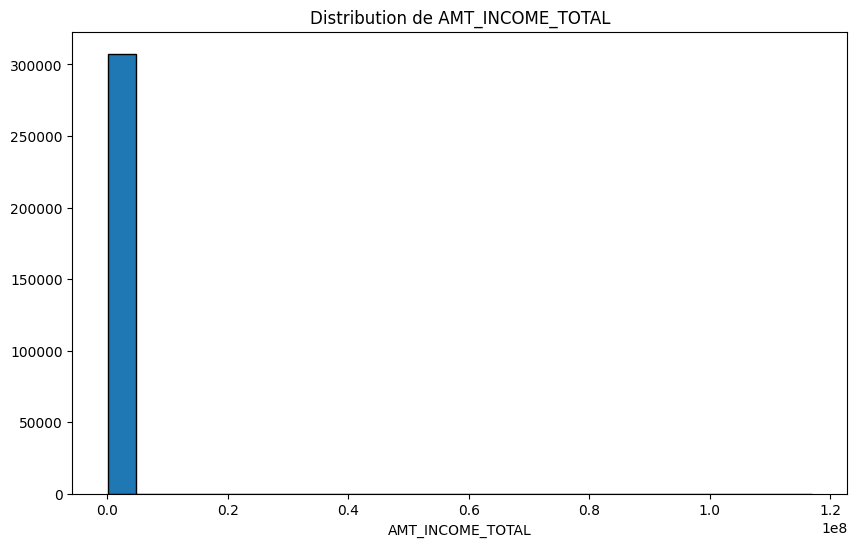

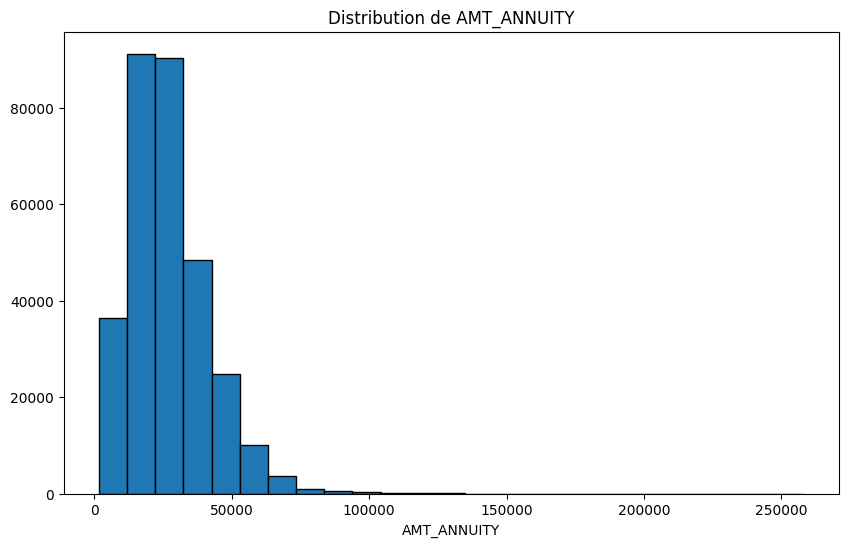

...

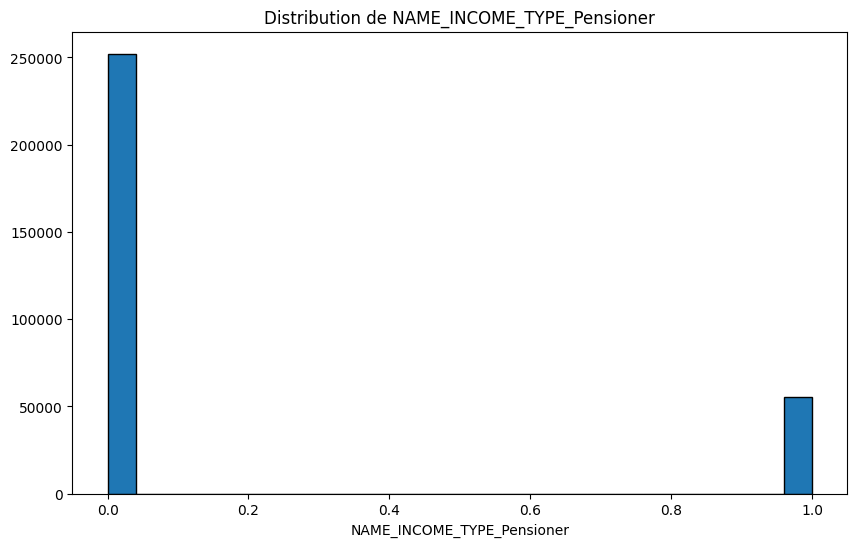

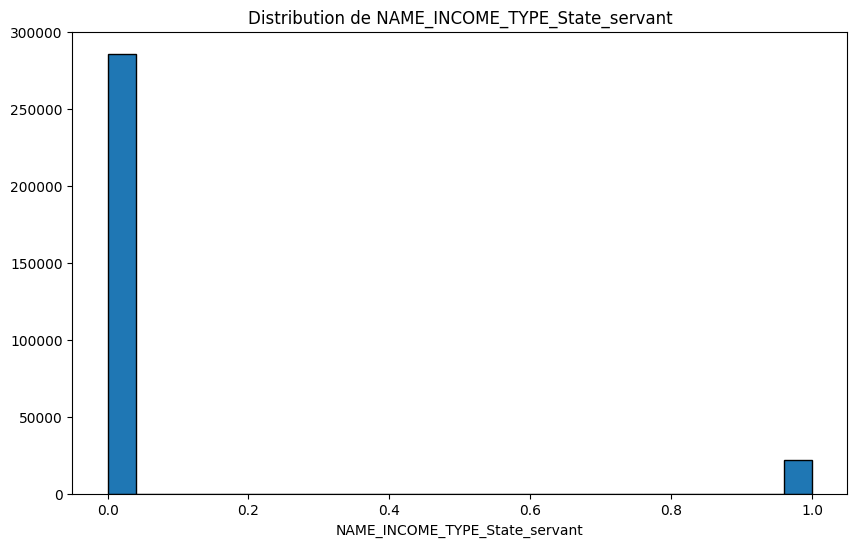

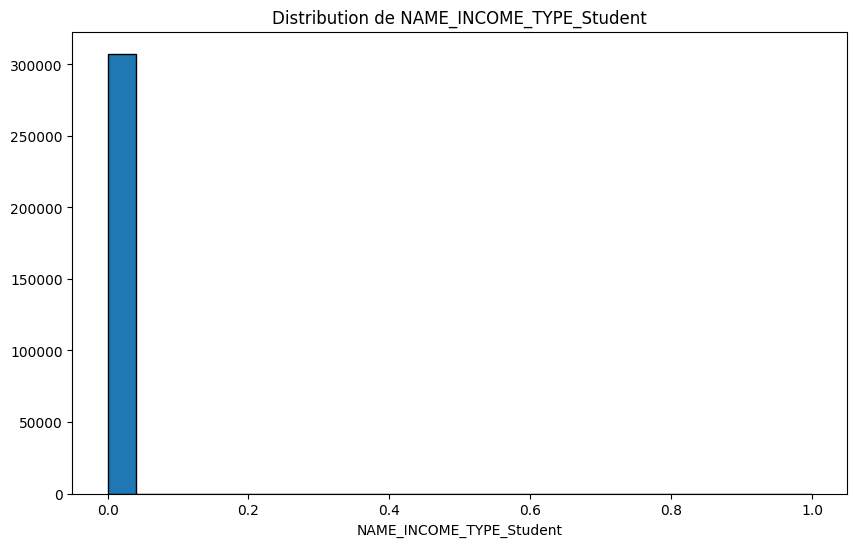

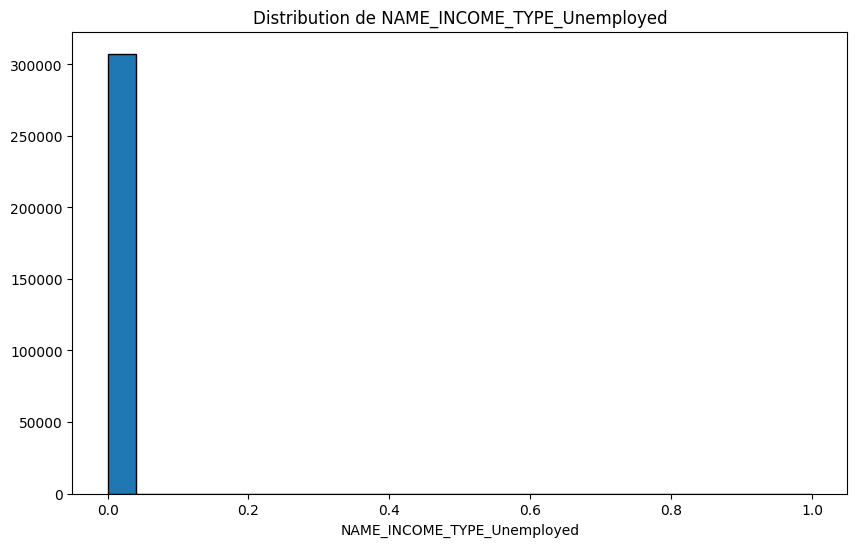

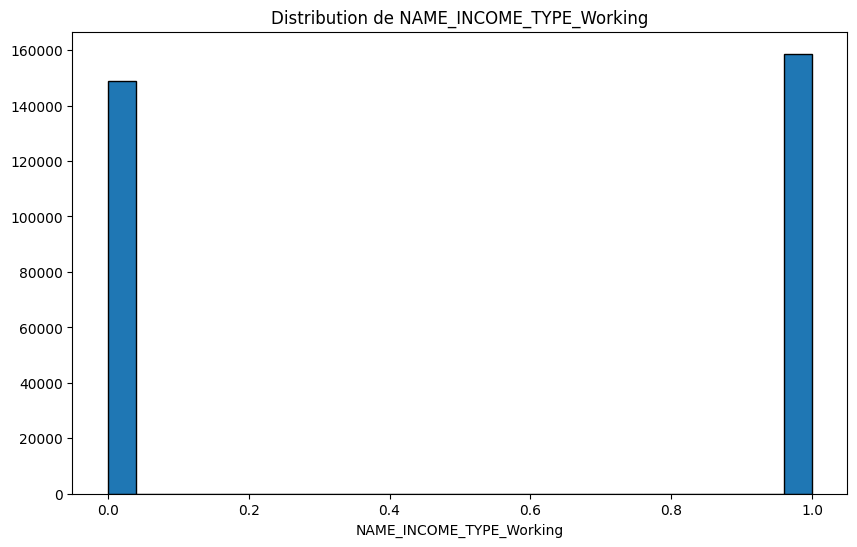

In [20]:
for var in Selected_variables:
    plt.figure(figsize=(10, 6))  # Crée une nouvelle figure
    plt.hist(application_train[var], edgecolor='k', bins=25)
    plt.title(f'Distribution de {var}')
    plt.xlabel(var)
    plt.show()  # Affiche la figure

In [21]:
anom = application_train[application_train['DAYS_EMPLOYED'] == 365243]
non_anom = application_train[application_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('Il y a %d de jours travaillés qui sont aberrants' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
Il y a 55374 de jours travaillés qui sont aberrants


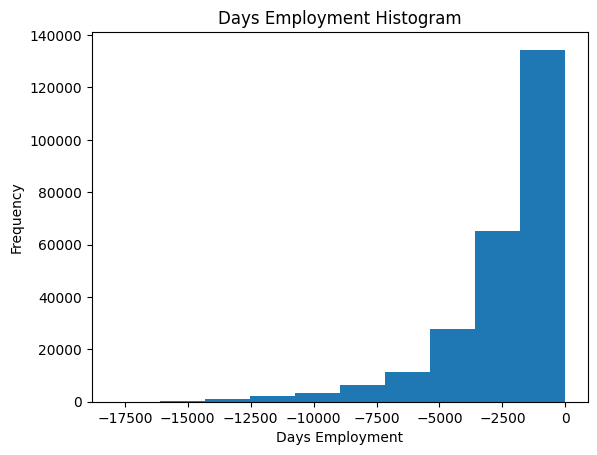

In [22]:
# Create an anomalous flag column
application_train['DAYS_EMPLOYED_ANOM'] = application_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
application_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

application_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [23]:
# Find correlations with the target and sort
correlations = application_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

<ipython-input-23-e844a45168c9>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlations = application_train.corr()['TARGET'].sort_values()


Most Positive Correlations:
 OWN_CAR_AGE                    0.037612
DAYS_REGISTRATION              0.041975
FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
CODE_GENDER_M                  0.054713
DAYS_LAST_PHONE_CHANGE         0.055218
NAME_INCOME_TYPE_Working       0.057481
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_EMPLOYED                  0.074958
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
CODE_GENDER_F                -0.054704
NAME_INCOME_TYPE_Pensioner   -0.046209
DAYS_EMPLOYED_ANOM           -0.045987
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768


In [24]:
# the positive days since birth
application_train['YEARS_BIRTH'] = abs(application_train['DAYS_BIRTH'])/365
# the percentage of the credit amount relative to a client's income
application_train['CREDIT_INCOME_PERCENT'] = application_train['AMT_CREDIT'] / application_train['AMT_INCOME_TOTAL']
#  the percentage of the loan annuity relative to a client's income
application_train['ANNUITY_INCOME_PERCENT'] = application_train['AMT_ANNUITY'] / application_train['AMT_INCOME_TOTAL']
# the length of the payment in months (since the annuity is the monthly amount due
application_train['CREDIT_TERM'] = application_train['AMT_CREDIT'] / application_train['AMT_ANNUITY']
# the percentage of the days employed relative to the client's age
application_train['DAYS_EMPLOYED_PERCENT'] = abs(application_train['DAYS_EMPLOYED'] / application_train['DAYS_BIRTH'])
print('correlation of the positive days since birth and target', application_train['YEARS_BIRTH'].corr(application_train['TARGET']))
print('correlation of credit income % and target',application_train['CREDIT_INCOME_PERCENT'].corr(application_train['TARGET']))
print('correlation of annuity income % and target',application_train['ANNUITY_INCOME_PERCENT'].corr(application_train['TARGET']))
print('correlation of credit term and target',application_train['CREDIT_TERM'].corr(application_train['TARGET']))
print('correlation of employed days % and target',application_train['DAYS_EMPLOYED_PERCENT'].corr(application_train['TARGET']))

correlation of the positive days since birth and target -0.07823930830982698
correlation of credit income % and target -0.007726797322294056
correlation of annuity income % and target 0.014265220698054677
correlation of credit term and target -0.032101516837309434
correlation of employed days % and target -0.06795454075818767


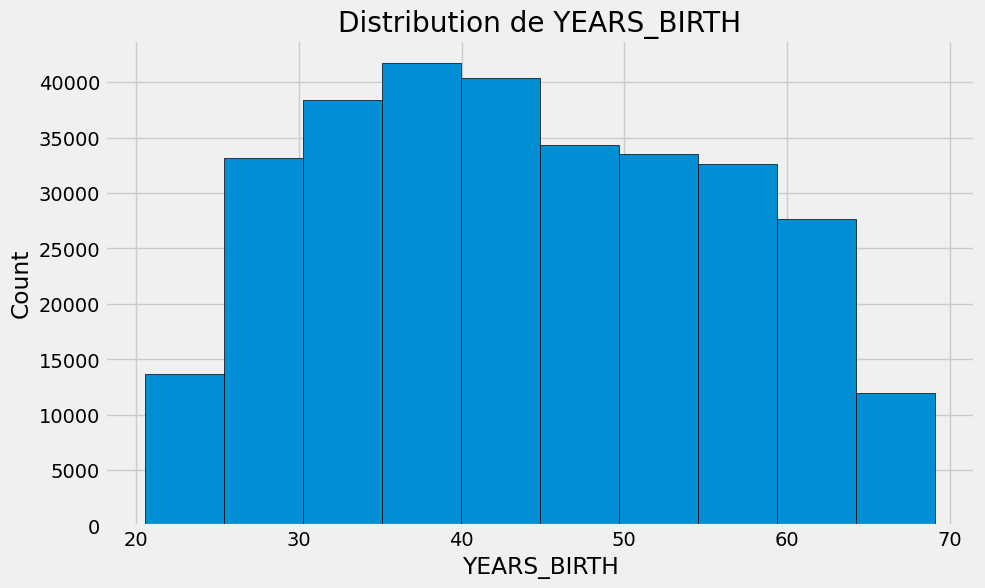

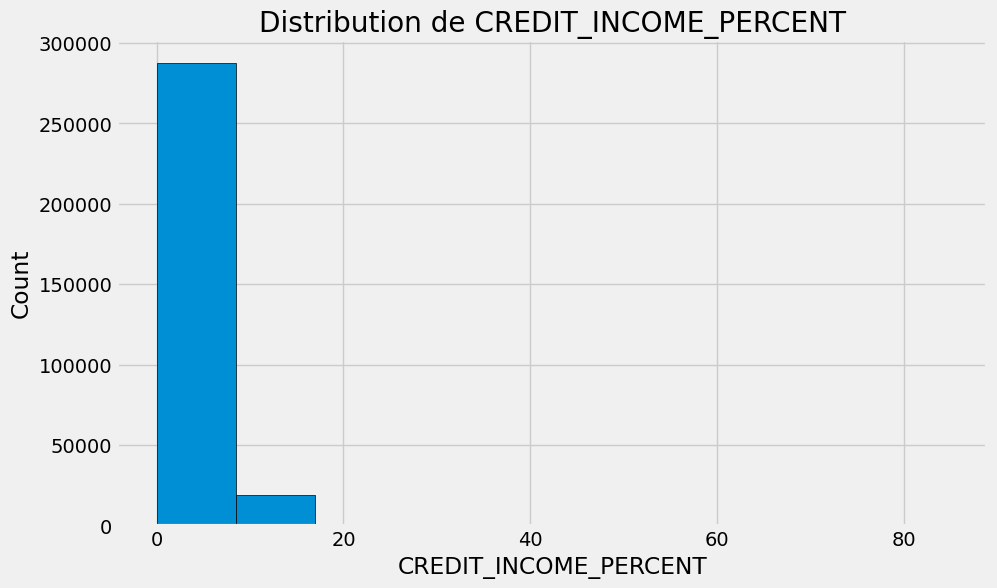

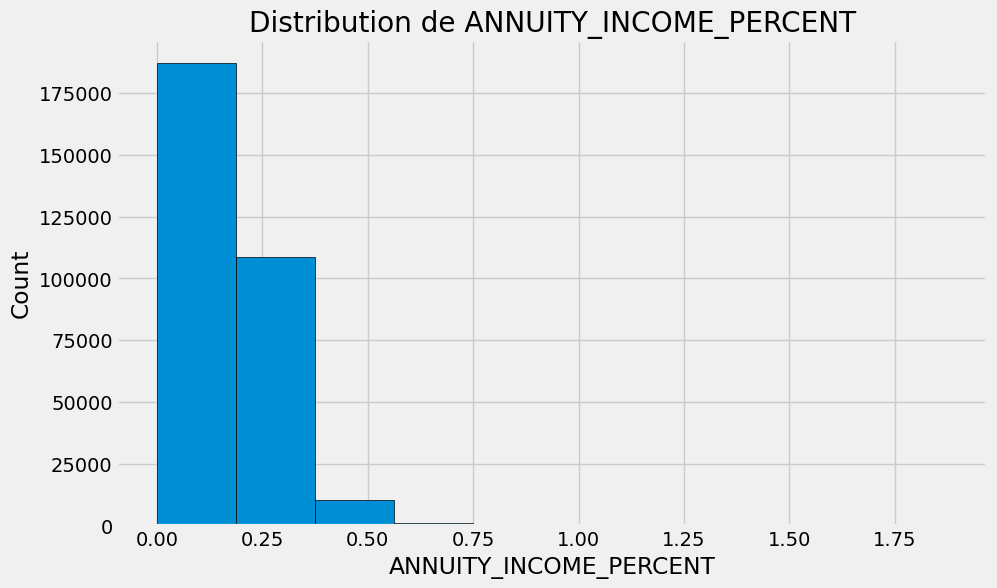

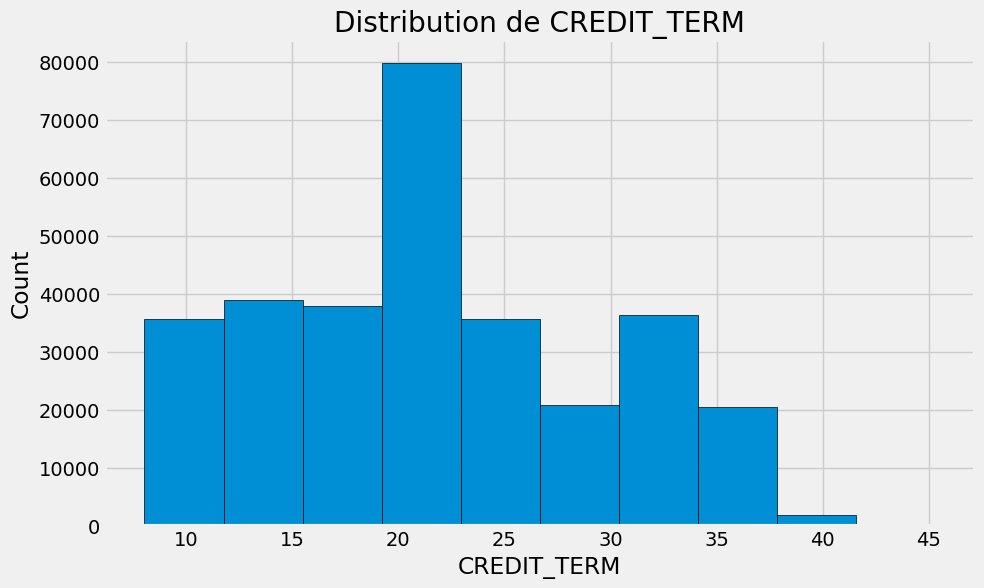

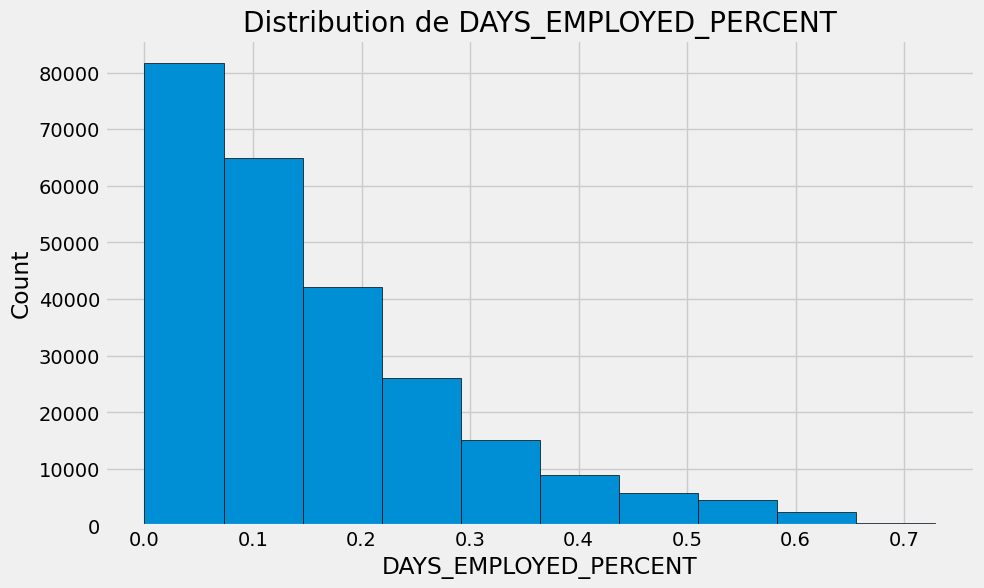

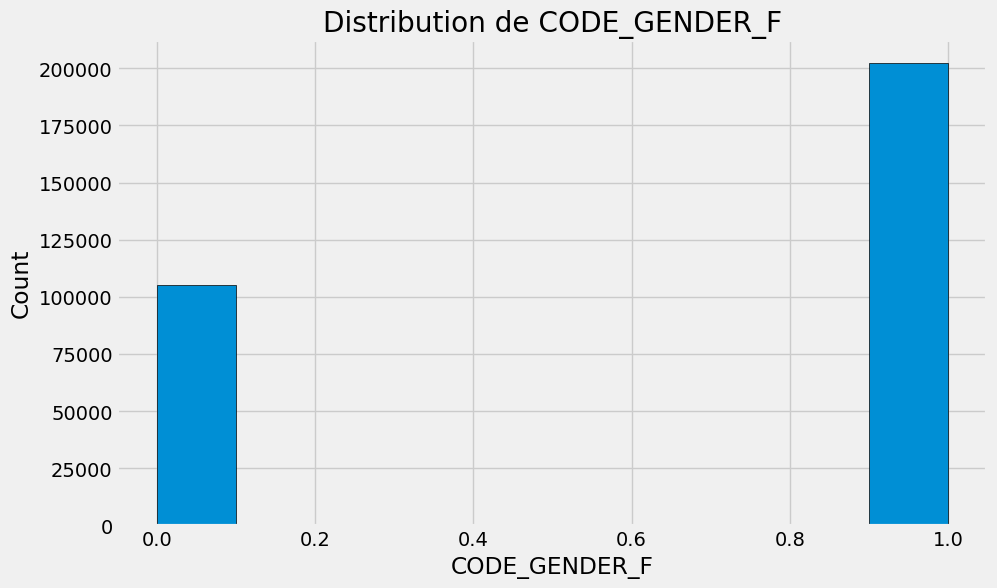

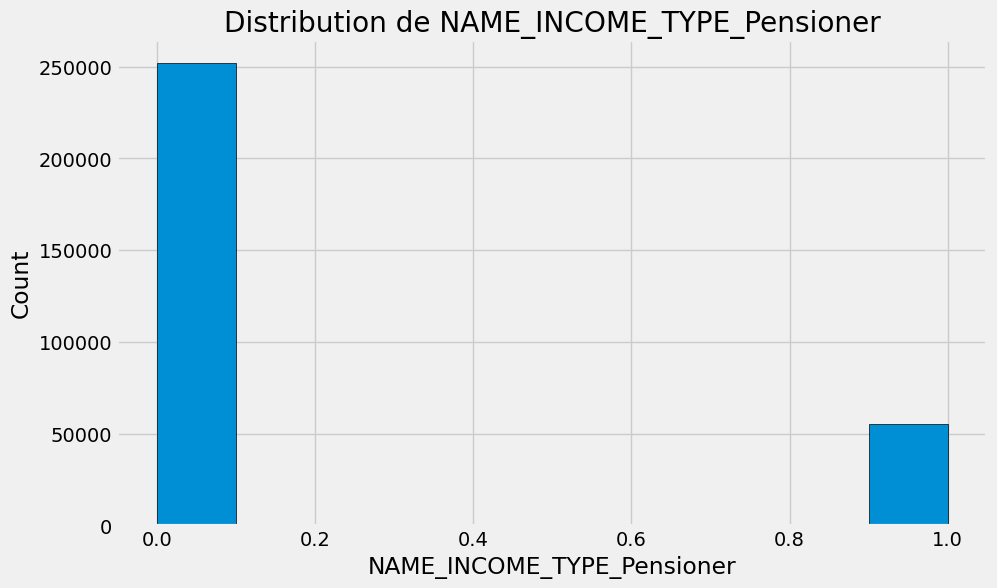

In [25]:
# Liste des nouvelles variables à traiter
my_variables = ['YEARS_BIRTH','CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT','CODE_GENDER_F','NAME_INCOME_TYPE_Pensioner']

# Set the style of plots
plt.style.use('fivethirtyeight')

# Boucle à travers les nouvelles variables et trace les distributions
for var in my_variables:
    plt.figure(figsize=(10, 6))  # Crée une nouvelle figure
    plt.hist(application_train[var], edgecolor='k', bins=10)
    plt.title(f'Distribution de {var}')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.show()  # Affiche la figure


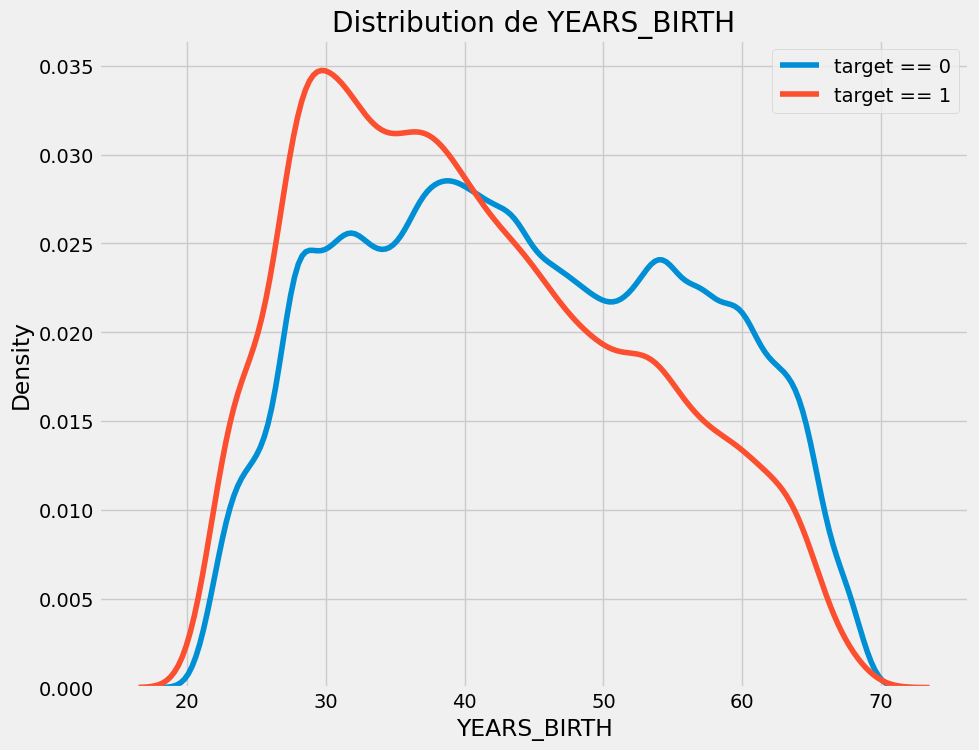

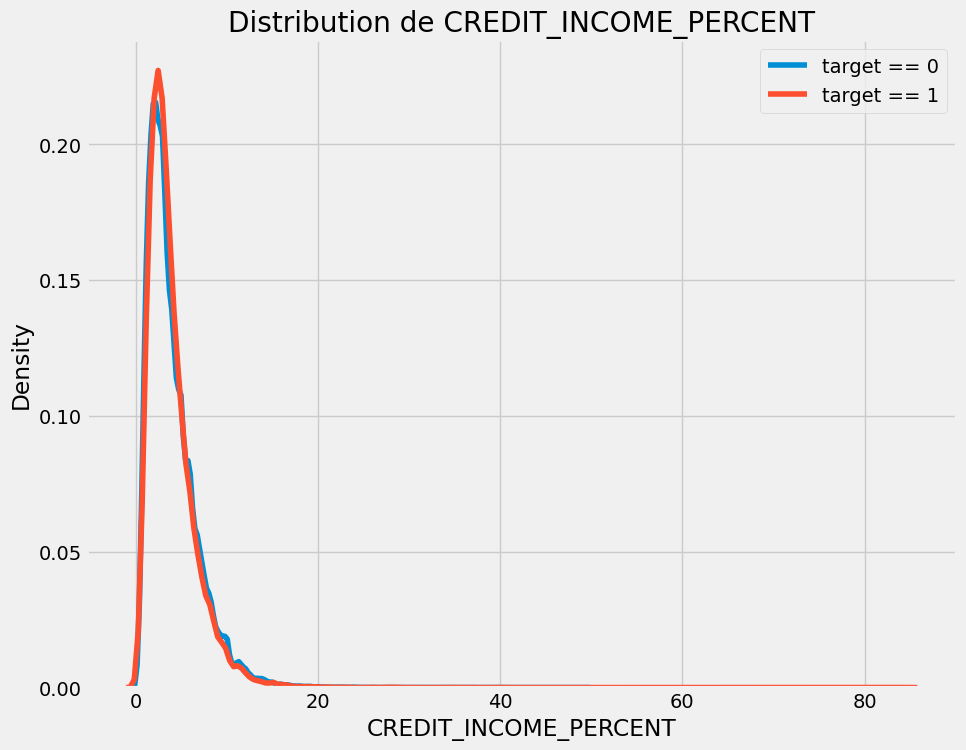

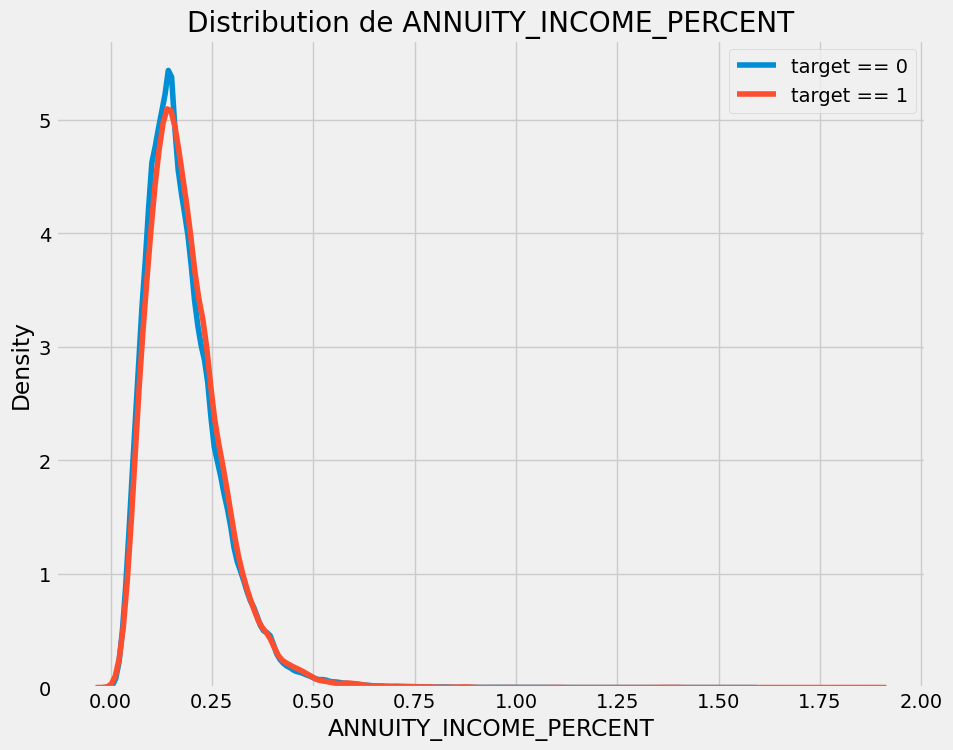

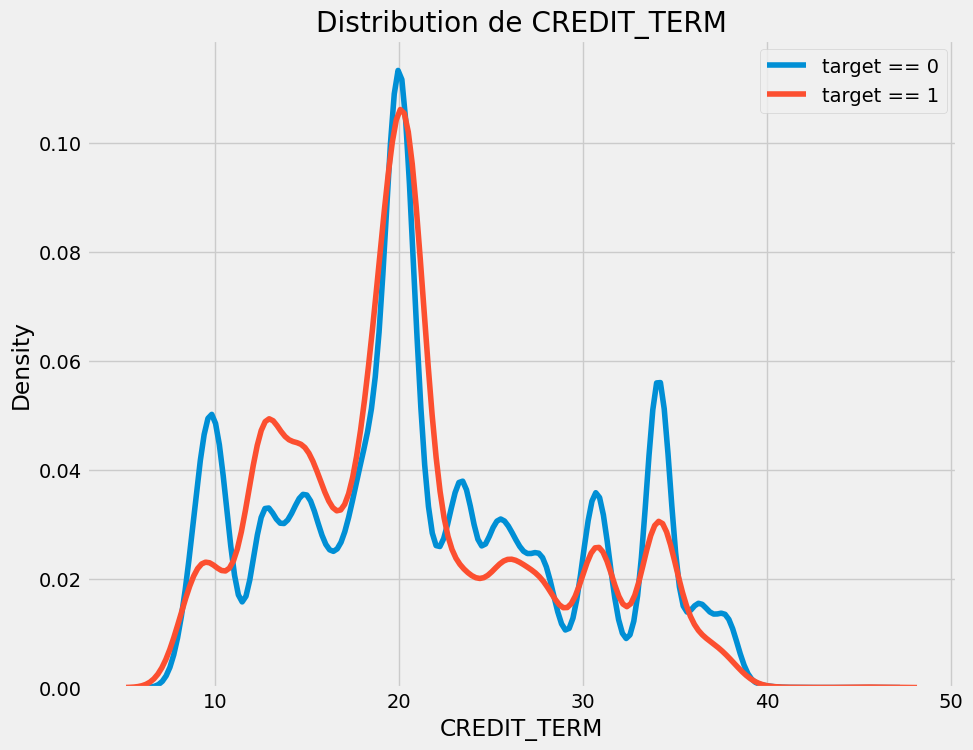

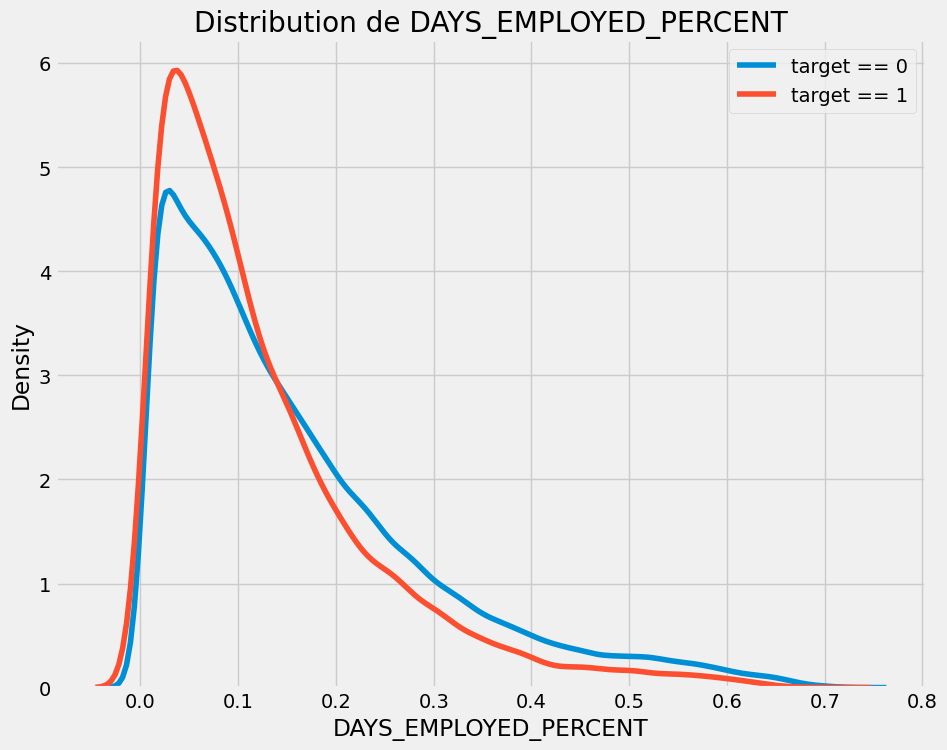

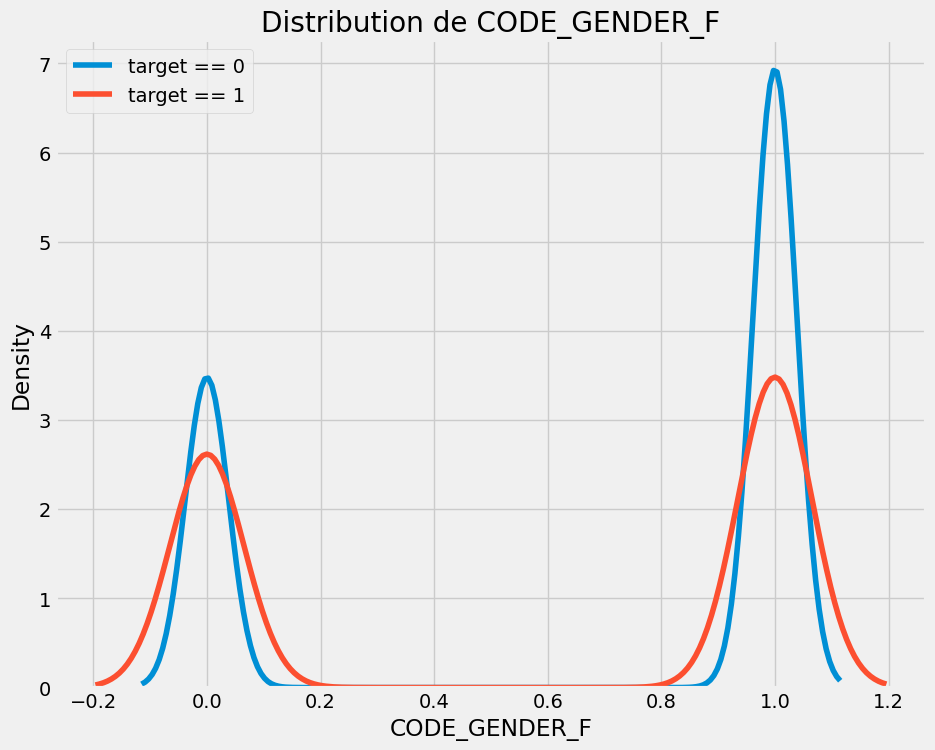

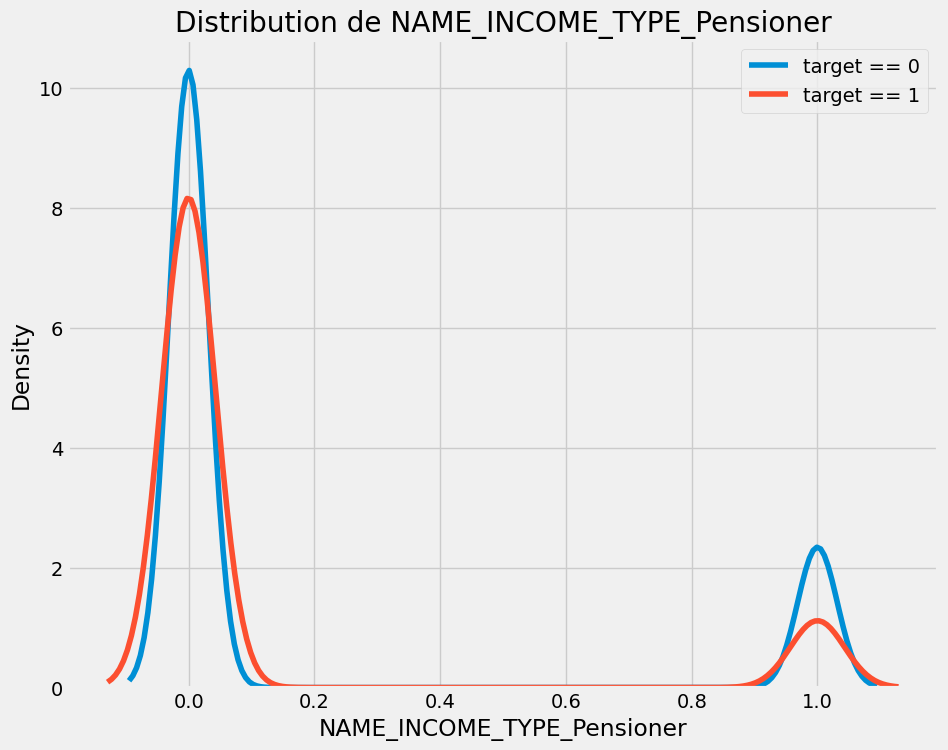

In [26]:
# Boucle à travers les nouvelles variables et trace les distributions
for var in my_variables:
    plt.figure(figsize=(10, 8))  # Crée une nouvelle figure
    sns.kdeplot(application_train.loc[application_train['TARGET'] == 0, var], label='target == 0')
    sns.kdeplot(application_train.loc[application_train['TARGET'] == 1, var], label='target == 1')
    plt.xlabel(var)
    plt.ylabel('Density')
    plt.title(f'Distribution de {var}')
    plt.legend()
    plt.show()  # Affiche la figure

In [27]:
# Age information into a separate dataframe
age_data = application_train[['TARGET', 'YEARS_BIRTH','CODE_GENDER_F','NAME_INCOME_TYPE_Pensioner']].copy()

# Utiliser .loc pour éviter la copie et modifier la copie directement
age_data.loc[:, 'YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins=np.linspace(20, 70, num=11))
age_data.head(10)

,TARGET,YEARS_BIRTH,CODE_GENDER_F,NAME_INCOME_TYPE_Pensioner,YEARS_BINNED
0,1,25.920548,0,0,"(25.0, 30.0]"
1,0,45.931507,1,0,"(45.0, 50.0]"
2,0,52.180822,0,0,"(50.0, 55.0]"
3,0,52.068493,1,0,"(50.0, 55.0]"
4,0,54.608219,0,0,"(50.0, 55.0]"
5,0,46.413699,0,0,"(45.0, 50.0]"
6,0,37.747945,1,0,"(35.0, 40.0]"
7,0,51.643836,0,0,"(50.0, 55.0]"
8,0,55.065753,1,1,"(55.0, 60.0]"
9,0,39.641096,0,0,"(35.0, 40.0]"


In [28]:
# Créer un DataFrame pour stocker les données d'expérience
My_variables_data = application_train[['TARGET'] + my_variables].copy()

# Utiliser .loc pour effectuer des opérations directement sur le DataFrame
for var in my_variables:
    My_variables_data.loc[:, f'BINNED_{var}'] = pd.cut(My_variables_data[var], bins=np.linspace(0, 1, num=11))

# Afficher les premières lignes du DataFrame d'expérience
print(My_variables_data.head(10))

   TARGET  YEARS_BIRTH  CREDIT_INCOME_PERCENT  ANNUITY_INCOME_PERCENT  \
0       1    25.920548               2.007889                0.121978   
1       0    45.931507               4.790750                0.132217   
2       0    52.180822               2.000000                0.100000   
3       0    52.068493               2.316167                0.219900   
4       0    54.608219               4.222222                0.179963   
5       0    46.413699               4.954500                0.277955   
6       0    37.747945               9.127053                0.241526   
7       0    51.643836               4.250000                0.116875   
8       0    55.065753               9.063200                0.300680   
9       0    39.641096               3.000000                0.150000   

   CREDIT_TERM  DAYS_EMPLOYED_PERCENT  CODE_GENDER_F  \
0    16.461104               0.067329              0   
1    36.234085               0.070862              1   
2    20.000000              

In [29]:
# Supprimer la colonne existante et la remplacer par la colonne du DataFrame age_data
My_variables_data.drop(columns=['BINNED_YEARS_BIRTH'], inplace=True)  # Supprime la colonne existante

# Remplacer par la colonne age_data['YEARS_BINNED']
My_variables_data['BINNED_YEARS_BIRTH'] = age_data['YEARS_BINNED']

In [30]:
age_groups  = My_variables_data.groupby('BINNED_YEARS_BIRTH').mean()
age_groups

<ipython-input-30-2998615a035c>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  age_groups  = My_variables_data.groupby('BINNED_YEARS_BIRTH').mean()


,TARGET,YEARS_BIRTH,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,CODE_GENDER_F,NAME_INCOME_TYPE_Pensioner
BINNED_YEARS_BIRTH,,,,,,,,
"(20.0, 25.0]",0.123036,23.377522,2.982793,0.157292,19.059486,0.091333,0.546427,0.002714
"(25.0, 30.0]",0.111436,27.822518,3.359981,0.173236,19.335223,0.127146,0.575163,0.003013
"(30.0, 35.0]",0.102814,32.479037,3.609833,0.174806,20.484863,0.150167,0.592672,0.003981
"(35.0, 40.0]",0.089414,37.555913,3.905472,0.177400,21.732934,0.162425,0.623705,0.007955
"(40.0, 45.0]",0.078491,42.459346,4.019603,0.179472,22.169277,0.168665,0.635246,0.015360
"(45.0, 50.0]",0.074171,47.462741,4.192322,0.182631,22.659080,0.167582,0.662900,0.033585
"(50.0, 55.0]",0.066968,52.593136,4.284149,0.186230,22.791875,0.172453,0.698872,0.123404
"(55.0, 60.0]",0.055314,57.491131,4.514867,0.191378,23.313659,0.178094,0.751117,0.574547
"(60.0, 65.0]",0.052737,62.412459,4.599042,0.197449,23.041902,0.185655,0.777042,0.811654


In [31]:
exp_groups  = My_variables_data.groupby('BINNED_DAYS_EMPLOYED_PERCENT').mean()
exp_groups

<ipython-input-31-6479a72a9739>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  exp_groups  = My_variables_data.groupby('BINNED_DAYS_EMPLOYED_PERCENT').mean()


,TARGET,YEARS_BIRTH,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT,CODE_GENDER_F,NAME_INCOME_TYPE_Pensioner
BINNED_DAYS_EMPLOYED_PERCENT,,,,,,,,
"(0.0, 0.1]",0.105277,40.074460,3.768720,0.175961,21.231509,0.050067,0.593742,0.000037
"(0.1, 0.2]",0.084709,39.602544,3.811944,0.177018,21.331310,0.145199,0.623227,0.000028
"(0.2, 0.3]",0.066853,40.143511,3.922862,0.178110,21.768974,0.244379,0.641441,0.000027
"(0.3, 0.4]",0.059625,41.184272,4.041621,0.179584,22.203545,0.343842,0.659158,0.000000
"(0.4, 0.5]",0.048214,43.681448,4.214489,0.181062,22.879687,0.445353,0.686155,0.000000
"(0.5, 0.6]",0.047460,47.719728,4.371265,0.183975,23.307051,0.545442,0.783181,0.000333
"(0.6, 0.7]",0.030523,54.640229,4.379782,0.184116,23.555480,0.635185,0.826550,0.000484
"(0.7, 0.8]",0.028571,63.732290,3.459993,0.154505,21.655869,0.709341,0.742857,0.000000
"(0.8, 0.9]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


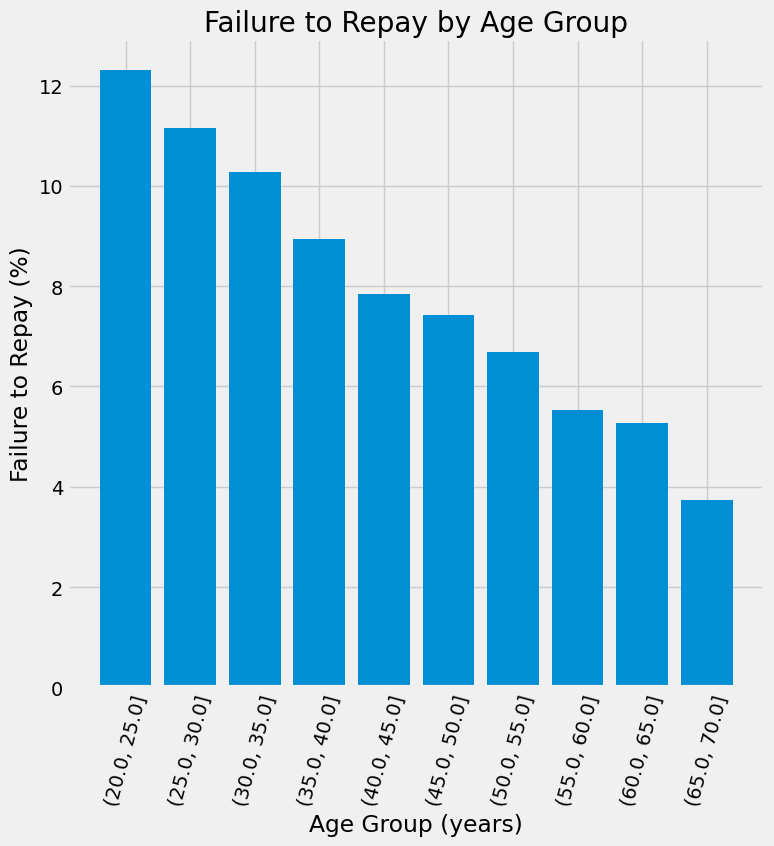

In [32]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

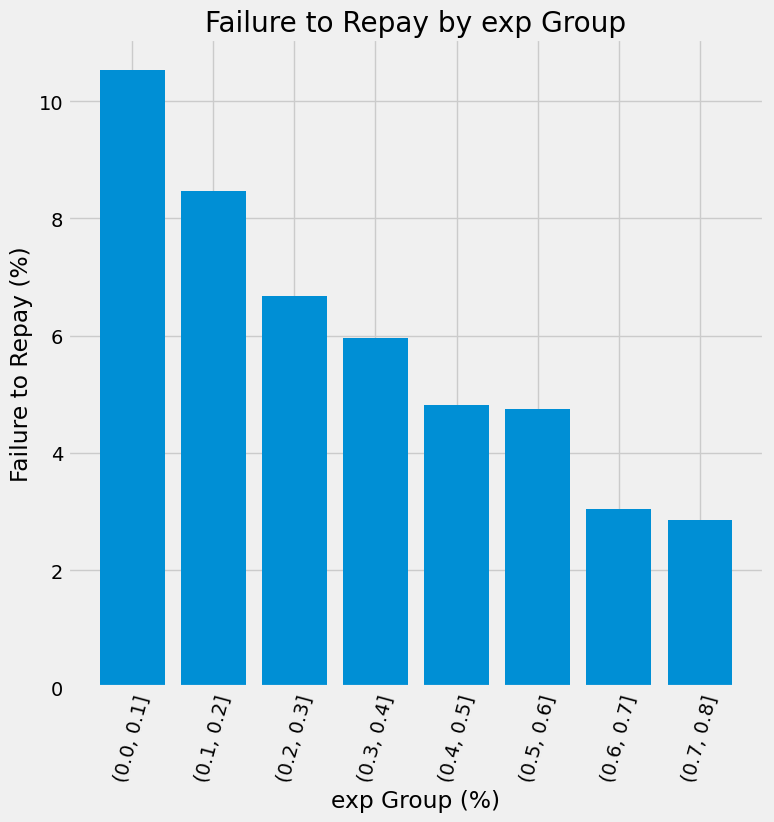

In [33]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(exp_groups.index.astype(str), 100 * exp_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('exp Group (%)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by exp Group');

In [34]:
# Liste des noms de colonnes à extraire
columns_to_extract = ['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'YEARS_BIRTH',
                      'CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT','CODE_GENDER_F','NAME_INCOME_TYPE_Pensioner']

# Extraire les colonnes du DataFrame application_train
application_train_short = application_train[columns_to_extract]

# Calculer les corrélations
application_train_short_corrs = application_train_short.corr()

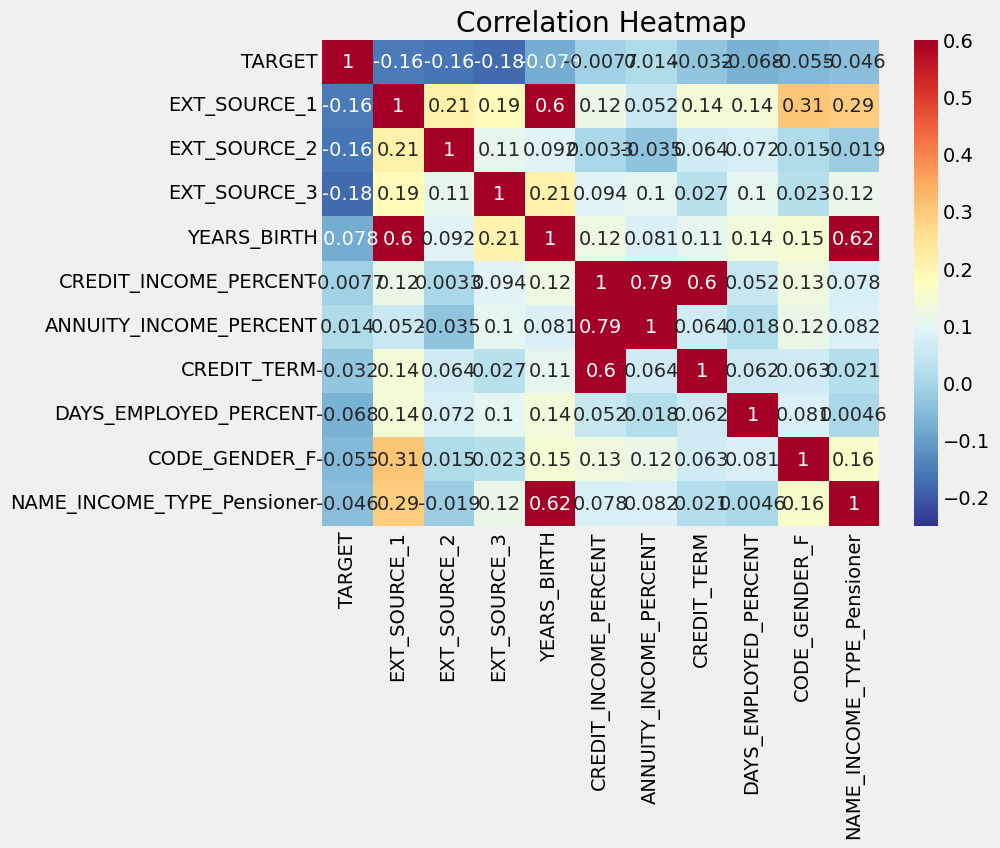

In [35]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations
sns.heatmap(application_train_short_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

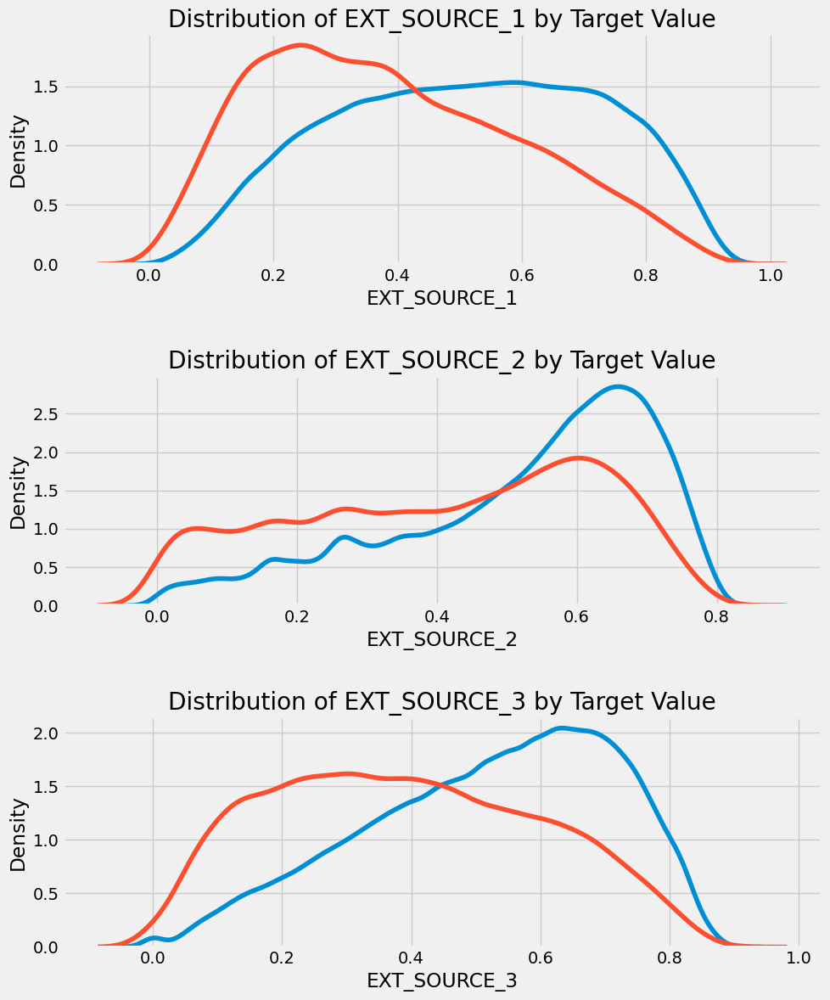

In [36]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):

    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(application_train.loc[application_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(application_train.loc[application_train['TARGET'] == 1, source], label = 'target == 1')

    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');

plt.tight_layout(h_pad = 2.5)

# Copy the data for plotting
plot_data = application_train_short.drop(columns=['YEARS_BIRTH']).copy()


# Drop na values and limit to first 100000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Function to calculate correlation coefficient between two columns
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                size=20)

# Create the pairgrid object
grid = sns.PairGrid(data=plot_data, height=3, diag_sharey=False,
                    hue='TARGET',
                    vars=[x for x in list(plot_data.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid.map_upper(plt.scatter, alpha=0.2)

# Diagonal is a histogram
grid.map_diag(sns.kdeplot)

# Bottom is density plot
grid.map_lower(sns.kdeplot, cmap=plt.cm.OrRd_r)

plt.suptitle('Ext Source and Age Features Pairs Plot', size=32, y=1.05)


# Copy the data for plotting
plot_data_exp = application_train_short.drop(columns=['DAYS_EMPLOYED_PERCENT']).copy()

# Drop na values and limit to first 100000 rows
plot_data_exp = plot_data_exp.dropna().loc[:100000, :]


# Create the pairgrid object
grid_exp = sns.PairGrid(data=plot_data_exp, height=3, diag_sharey=False,
                    hue='TARGET',
                    vars=[x for x in list(plot_data_exp.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid_exp.map_upper(plt.scatter, alpha=0.2)

# Diagonal is a histogram
grid_exp.map_diag(sns.kdeplot)

# Bottom is density plot
grid_exp.map_lower(sns.kdeplot, cmap=plt.cm.OrRd_r)

plt.suptitle('Ext Source and exp Features Pairs Plot', size=32, y=1.05)


In [37]:
application_train_short.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   TARGET                      307511 non-null  int64  
 1   EXT_SOURCE_1                134133 non-null  float64
 2   EXT_SOURCE_2                306851 non-null  float64
 3   EXT_SOURCE_3                246546 non-null  float64
 4   YEARS_BIRTH                 307511 non-null  float64
 5   CREDIT_INCOME_PERCENT       307511 non-null  float64
 6   ANNUITY_INCOME_PERCENT      307499 non-null  float64
 7   CREDIT_TERM                 307499 non-null  float64
 8   DAYS_EMPLOYED_PERCENT       252137 non-null  float64
 9   CODE_GENDER_F               307511 non-null  uint8  
 10  NAME_INCOME_TYPE_Pensioner  307511 non-null  uint8  
dtypes: float64(8), int64(1), uint8(2)
memory usage: 21.7 MB


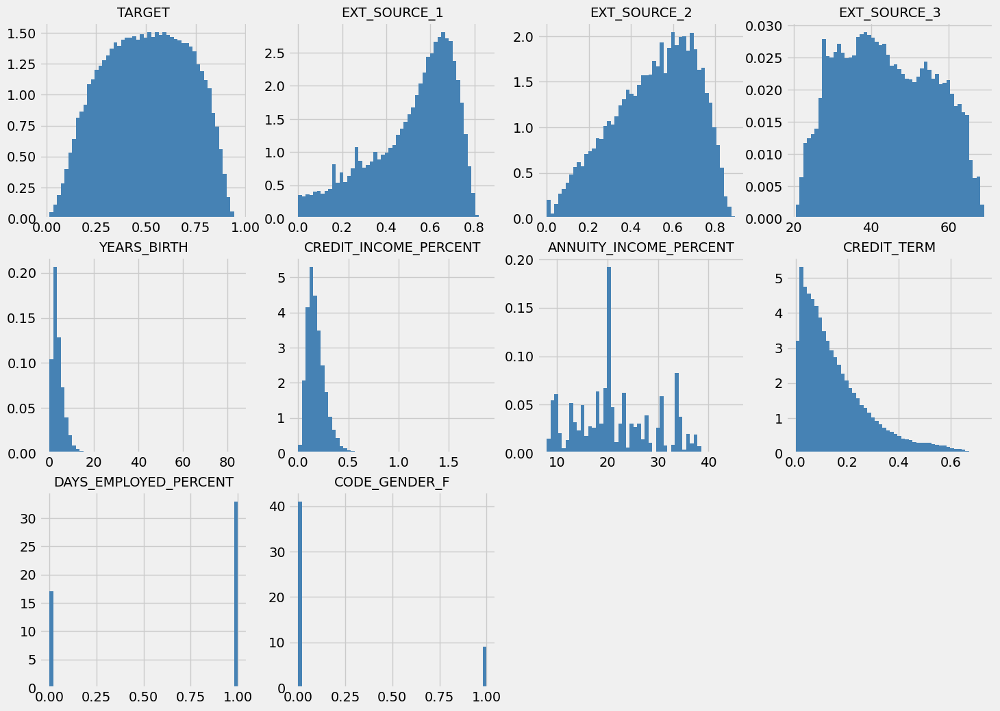

In [38]:
fig = plt.figure(figsize=(16, 12))
X0 = application_train_short.drop(columns=application_train_short.columns[0]).values
for feat_idx in range(X0.shape[1]):
    ax = fig.add_subplot(3,4, (feat_idx+1))
    h = ax.hist(X0[:, feat_idx], bins=50, color='steelblue', density=True, edgecolor='none')
    ax.set_title(application_train_short.columns[feat_idx], fontsize=14)

In [39]:
application_train_short['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [40]:
application_train_short.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   TARGET                      307511 non-null  int64  
 1   EXT_SOURCE_1                134133 non-null  float64
 2   EXT_SOURCE_2                306851 non-null  float64
 3   EXT_SOURCE_3                246546 non-null  float64
 4   YEARS_BIRTH                 307511 non-null  float64
 5   CREDIT_INCOME_PERCENT       307511 non-null  float64
 6   ANNUITY_INCOME_PERCENT      307499 non-null  float64
 7   CREDIT_TERM                 307499 non-null  float64
 8   DAYS_EMPLOYED_PERCENT       252137 non-null  float64
 9   CODE_GENDER_F               307511 non-null  uint8  
 10  NAME_INCOME_TYPE_Pensioner  307511 non-null  uint8  
dtypes: float64(8), int64(1), uint8(2)
memory usage: 21.7 MB


from sklearn.impute import KNNImputer

# Créer un imputeur avec la stratégie de remplacement KNN
imputer_knn = KNNImputer(n_neighbors=5)

# Appliquer l'imputation KNN sur le DataFrame application_train_short
application_train_short_sample_imputed_knn = imputer_knn.fit_transform(application_train_short_sample)

# Convertir le résultat en DataFrame avec les mêmes noms de colonnes
application_train_short_sample_imputed_knn= pd.DataFrame(application_train_short_sample_imputed_knn, columns=application_train_short_sample.columns)


# Appliquer l'imputation KNN sur le DataFrame application_train_short
application_train_short_imputed_knn = imputer_knn.fit_transform(application_train_short)

# Convertir le résultat en DataFrame avec les mêmes noms de colonnes
application_train_short_imputed_knn = pd.DataFrame(application_train_short_imputed_knn, columns=application_train_short.columns)


# Sauvegarder le DataFrame imputé dans un fichier CSV
application_train_short_sample_imputed_knn.to_csv('application_train_short_sample_imputed_knn.csv', index=False)

# Sauvegarder le DataFrame imputé dans un fichier CSV
application_train_short_imputed_knn.to_csv('application_train_short_imputed_knn.csv', index=False)

In [41]:
application_train_short_imputed_knn = application_train = pd.read_csv("/content/drive/My Drive/IAEngineer/IAEngineer/P4/application_train_short_imputed_knn.csv")

In [42]:
application_train_short_imputed_knn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   TARGET                      307511 non-null  float64
 1   EXT_SOURCE_1                307511 non-null  float64
 2   EXT_SOURCE_2                307511 non-null  float64
 3   EXT_SOURCE_3                307511 non-null  float64
 4   YEARS_BIRTH                 307511 non-null  float64
 5   CREDIT_INCOME_PERCENT       307511 non-null  float64
 6   ANNUITY_INCOME_PERCENT      307511 non-null  float64
 7   CREDIT_TERM                 307511 non-null  float64
 8   DAYS_EMPLOYED_PERCENT       307511 non-null  float64
 9   CODE_GENDER_F               307511 non-null  float64
 10  NAME_INCOME_TYPE_Pensioner  307511 non-null  float64
dtypes: float64(11)
memory usage: 25.8 MB


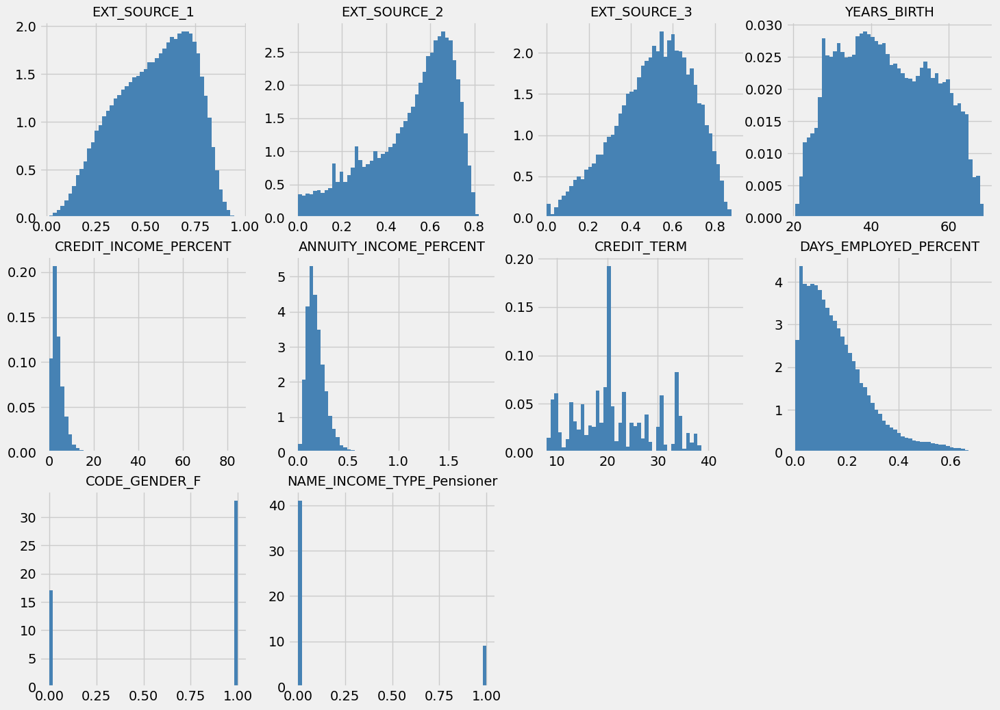

In [43]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(16, 12))
Z = application_train_short_imputed_knn.iloc[:, 1:]

for feat_idx, column in enumerate(Z.columns):
    ax = fig.add_subplot(3, 4, (feat_idx + 1))
    h = ax.hist(Z[column], bins=50, color='steelblue', density=True, edgecolor='none')
    ax.set_title(column, fontsize=14)

plt.show()


In [44]:
from sklearn import preprocessing
std_scale = preprocessing.StandardScaler().fit(application_train_short_imputed_knn)
application_train_short_imputed_knn_std = std_scale.transform(application_train_short_imputed_knn)

In [45]:
X = application_train_short_imputed_knn_std[:, 1:]
y = application_train_short_imputed_knn['TARGET'].values

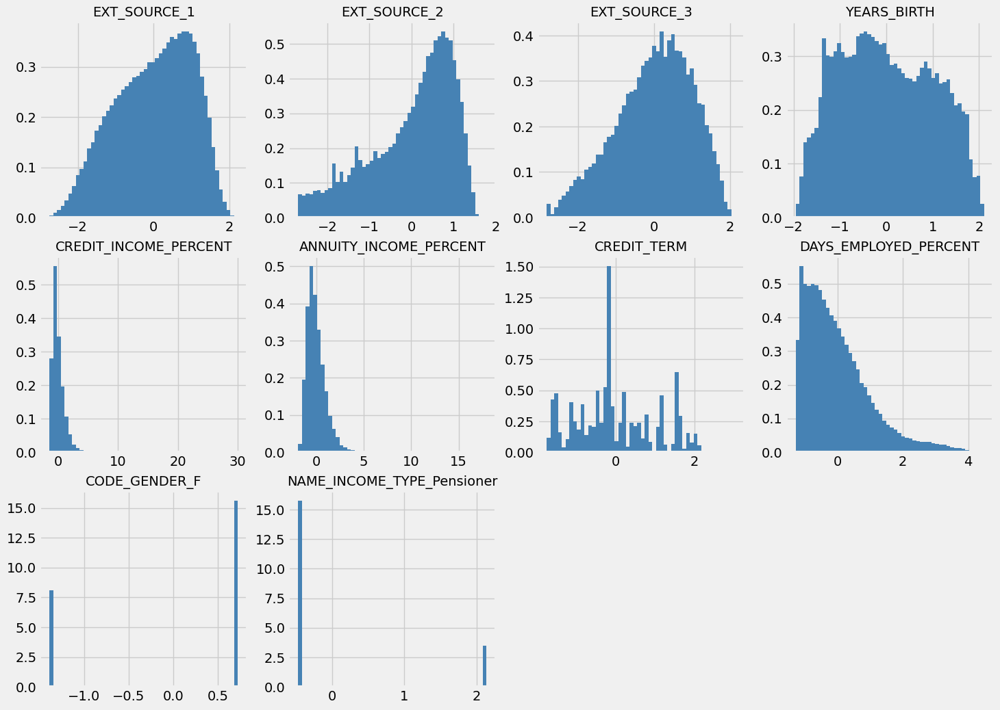

In [46]:
fig = plt.figure(figsize=(16, 12))
for feat_idx in range(X.shape[1]):
    ax = fig.add_subplot(3,4, (feat_idx+1))
    h = ax.hist(X[:, feat_idx], bins=50, color='steelblue', density=True, edgecolor='none')
    ax.set_title(application_train_short_imputed_knn.columns[feat_idx+1], fontsize=14)

(array([45.96355903,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  4.03644097]),
 array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 ,
        0.22, 0.24, 0.26, 0.28, 0.3 , 0.32, 0.34, 0.36, 0.38, 0.4 , 0.42,
        0.44, 0.46, 0.48, 0.5 , 0.52, 0.54, 0.56, 0.58, 0.6 , 0.62, 0.64,
        0.66, 0.68, 0.7 , 0.72, 0.74, 0.76, 0.

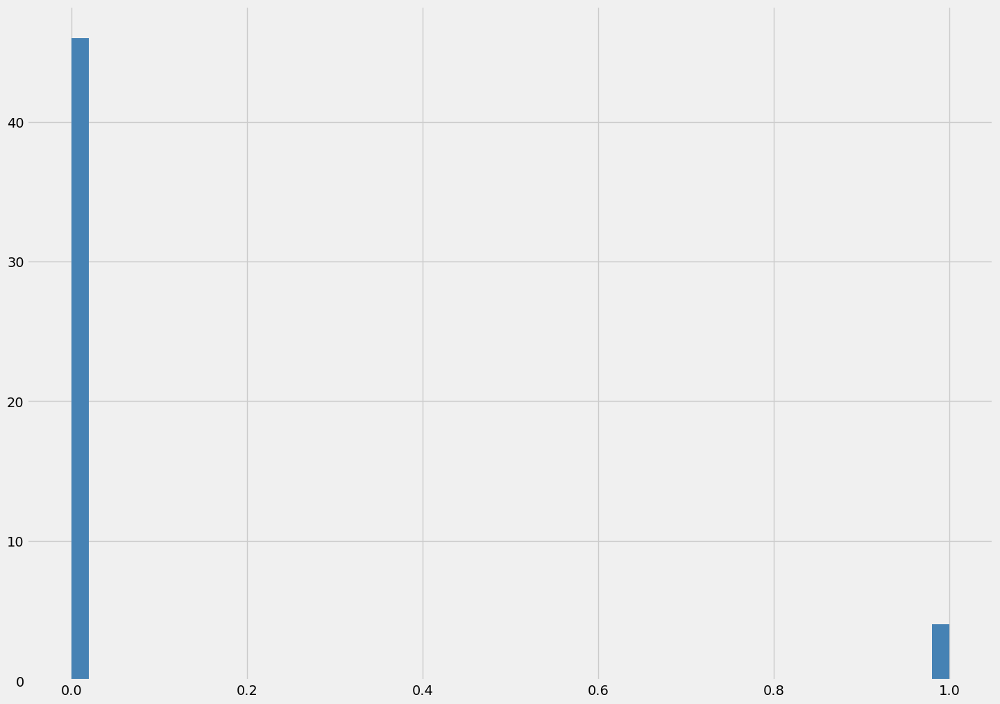

In [47]:
fig = plt.figure(figsize=(16, 12))
plt.hist(y, bins=50, color = 'steelblue', density=True, edgecolor='none')

In [48]:
from sklearn import model_selection
X_train, X_test, y_train, y_test = \
	model_selection.train_test_split(X, y,
                                	test_size=0.3 # 30% des données dans le jeu de test
                                	)

In [49]:
from imblearn.under_sampling import RandomUnderSampler

# Créer l'objet de sous-échantillonnage
under_sampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)

# Appliquer le sous-échantillonnage à vos données
X_train_resampled, y_train_resampled = under_sampler.fit_resample(X_train, y_train)

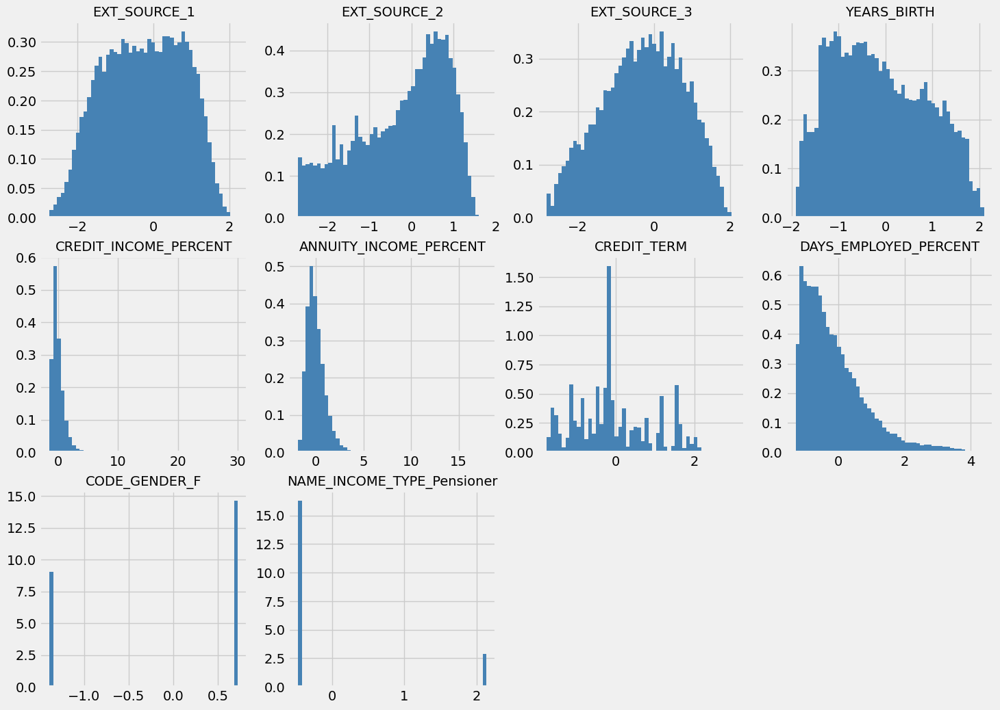

In [50]:
fig = plt.figure(figsize=(16, 12))
for feat_idx in range(X_train.shape[1]):
    ax = fig.add_subplot(3,4, (feat_idx+1))
    h = ax.hist(X_train_resampled[:, feat_idx], bins=50, color = 'steelblue', density=True, edgecolor='none')
    ax.set_title(application_train_short.columns[feat_idx+1], fontsize=14)


(array([25.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 25.]),
 array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 ,
        0.22, 0.24, 0.26, 0.28, 0.3 , 0.32, 0.34, 0.36, 0.38, 0.4 , 0.42,
        0.44, 0.46, 0.48, 0.5 , 0.52, 0.54, 0.56, 0.58, 0.6 , 0.62, 0.64,
        0.66, 0.68, 0.7 , 0.72, 0.74, 0.76, 0.78, 0.8 , 0.82, 0.84, 0.86,
        0.88, 0.9 , 0.92, 0.94, 0.96, 0.98, 1.  ]),
 <BarContainer object of 50 artists>)

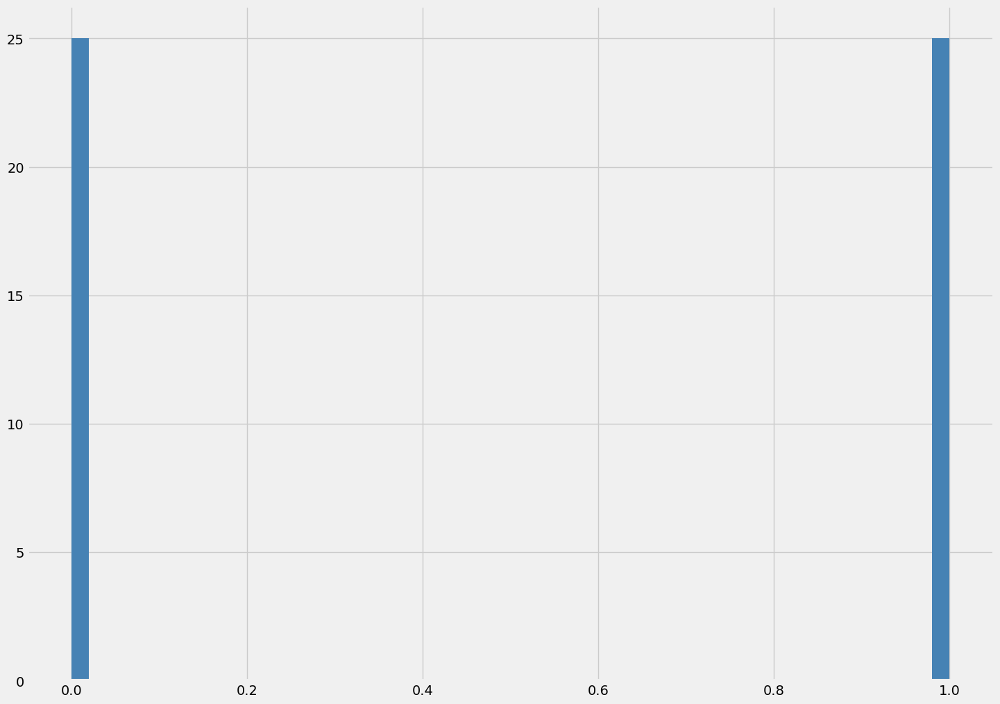

In [51]:
fig = plt.figure(figsize=(16, 12))
plt.hist(y_train_resampled, bins=50, color = 'steelblue', density=True, edgecolor='none')

In [52]:
from sklearn.metrics import make_scorer, fbeta_score
score1 = make_scorer(fbeta_score, beta=1)
score2 = make_scorer(fbeta_score, beta=4)
score5 = make_scorer(fbeta_score, beta=5)

# Regression logistique

1- Trouver le bon hyperparamètre en fonction de f-beta avec beta=2

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error

logreg_model = LogisticRegression()
logreg_model.fit(X_train_resampled, y_train_resampled)

# Prédisez les classes sur l'ensemble de test
y_pred_logreg = logreg_model.predict(X_test)

# Si vous souhaitez également obtenir les probabilités des classes
y_prob_logreg = logreg_model.predict_proba(X_test)

# Calculer l'erreur quadratique moyenne (MSE)
mse_logreg = mean_squared_error(y_test, y_pred_logreg)

# Calculer la racine carrée de l'erreur quadratique moyenne (RMSE)
rmse_logreg = np.sqrt(mse_logreg)
print("RMSE de la régression logistique:", rmse_logreg)

RMSE de la régression logistique: 0.5432195466676476


In [54]:
from sklearn import linear_model, model_selection

# Fixer les valeurs des hyperparamètres à tester
param_grid = {'C': [0.01, 0.1,1, 10, 100]}

# Créer un modèle de régression logistique avec recherche d'hyperparamètre par validation croisée
clf_logReg = model_selection.GridSearchCV(
    linear_model.LogisticRegression(), # modèle de régression logistique
    param_grid,     # hyperparamètres à tester
    cv=5,           # nombre de folds de validation croisée
    scoring=score2   # score à optimiser (F-beta)
)

# Optimiser ce modèle sur le jeu d'entraînement
clf_logReg.fit(X_train_resampled, y_train_resampled)

# Afficher le(s) hyperparamètre(s) optimaux
print("Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement Log Regression :")
print(clf_logReg.best_params_)

# Afficher les performances correspondantes
print("Résultats de la validation croisée Log Regression :")
for mean, std, params in zip(
        clf_logReg.cv_results_['mean_test_score'], # score moyen
        clf_logReg.cv_results_['std_test_score'],  # écart-type du score
        clf_logReg.cv_results_['params']           # valeur de l'hyperparamètre
    ):
    print("{} = {:.3f} (+/-{:.03f}) for {}".format(
        score2,
        mean,
        std*2,
        params
    ))


Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement Log Regression :
{'C': 0.01}
Résultats de la validation croisée Log Regression :
make_scorer(fbeta_score, beta=4) = 0.693 (+/-0.020) for {'C': 0.01}
make_scorer(fbeta_score, beta=4) = 0.693 (+/-0.020) for {'C': 0.1}
make_scorer(fbeta_score, beta=4) = 0.692 (+/-0.020) for {'C': 1}
make_scorer(fbeta_score, beta=4) = 0.692 (+/-0.020) for {'C': 10}
make_scorer(fbeta_score, beta=4) = 0.692 (+/-0.020) for {'C': 100}


2- Analyse des choix potentiels pour avoir des résultats optimaux.

In [55]:
logreg_model = LogisticRegression(C=0.1)
logreg_model.fit(X_train_resampled, y_train_resampled)

# Prédisez les classes sur l'ensemble de test
y_pred_logreg = logreg_model.predict(X_train)

# Si vous souhaitez également obtenir les probabilités des classes
y_prob_logreg = logreg_model.predict_proba(X_train)

In [56]:
thresholds = np.arange(0, 1.01, 0.01)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


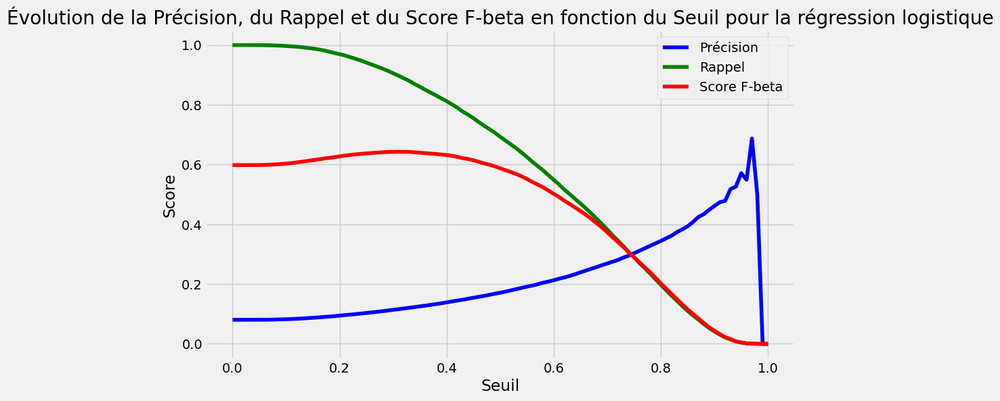

In [57]:
from sklearn.metrics import precision_score, recall_score, fbeta_score

# Initialisez des listes vides pour stocker les valeurs de précision, de rappel et de score F-beta
precisions_reglog = []
recalls_reglog = []
f_betas_reglog = []

for threshold in thresholds:
    y_pred_bin = (y_prob_logreg[:, 1] >= threshold).astype(int)

    # Calculez la précision, le rappel et le score F-beta
    precision_reglog = precision_score(y_train, y_pred_bin)
    recall_reglog = recall_score(y_train, y_pred_bin)
    f_beta_reglog = fbeta_score(y_train, y_pred_bin, beta=4)

    # Ajoutez les valeurs calculées aux listes
    precisions_reglog.append(precision_reglog)
    recalls_reglog.append(recall_reglog)
    f_betas_reglog.append(f_beta_reglog)

# Tracez les courbes
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions_reglog, label='Précision', color='blue')
plt.plot(thresholds, recalls_reglog, label='Rappel', color='green')
plt.plot(thresholds, f_betas_reglog, label='Score F-beta', color='red')

plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Évolution de la Précision, du Rappel et du Score F-beta en fonction du Seuil pour la régression logistique')
plt.legend()
plt.grid(True)
plt.show()

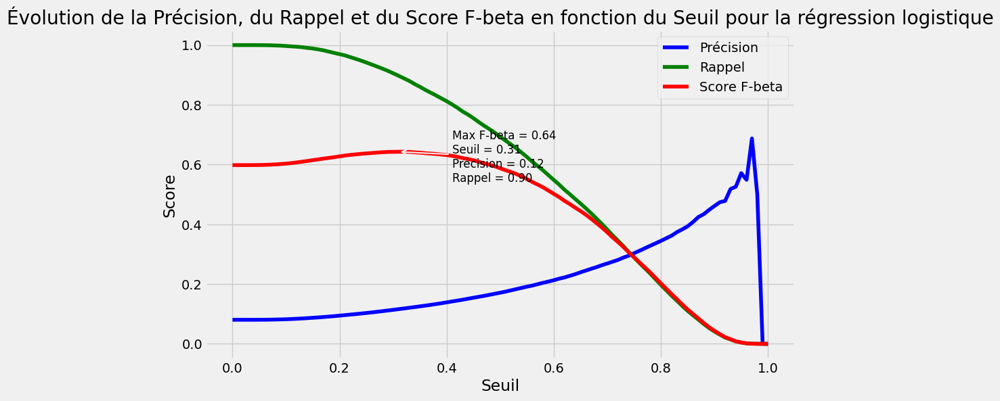

In [58]:
# Trouvez l'indice du maximum de f_betas
max_f_beta_idx = np.argmax(f_betas_reglog)

# Trouvez la valeur correspondante du seuil, de la précision et du rappel
best_threshold_reglog = thresholds[max_f_beta_idx]
best_precision_reglog = precisions_reglog[max_f_beta_idx]
best_recall_reglog = recalls_reglog[max_f_beta_idx]
best_f_beta_reglog = f_betas_reglog[max_f_beta_idx]

# Tracez les courbes
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions_reglog, label='Précision', color='blue')
plt.plot(thresholds, recalls_reglog, label='Rappel', color='green')
plt.plot(thresholds, f_betas_reglog, label='Score F-beta', color='red')

# Annoter le point où le score F-beta est maximal
plt.annotate(
    f'Max F-beta = {best_f_beta_reglog:.2f}\nSeuil = {best_threshold_reglog:.2f}\nPrécision = {best_precision_reglog:.2f}\nRappel = {best_recall_reglog:.2f}',
    xy=(best_threshold_reglog, best_f_beta_reglog),
    xytext=(best_threshold_reglog + 0.1, best_f_beta_reglog - 0.1),
    arrowprops=dict(arrowstyle='->', lw=1.5),
    fontsize=12,
    color='black',
)

plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Évolution de la Précision, du Rappel et du Score F-beta en fonction du Seuil pour la régression logistique')
plt.legend()
plt.grid(True)
plt.show()


In [59]:
from sklearn.metrics import confusion_matrix
y_pred_logReg_thresholded = (y_prob_logreg[:, 1] >= best_threshold_reglog).astype(int)
confusion_logReg = confusion_matrix(y_train, y_pred_logReg_thresholded)
print('Matrice de confusion pour la régression logistique pour le meilleur seuil')
print(confusion_logReg)

Matrice de confusion pour la régression logistique pour le meilleur seuil
[[ 79488 118427]
 [  1779  15563]]


# Méthode KNN

1- Trouver le bon hyperparamètre pour optimiser f beta avec beta =4

In [60]:
from sklearn import neighbors, metrics

In [61]:

# Fixer les valeurs des hyperparamètres à tester
param_grid_knn = {'n_neighbors':[3, 5, 7, 9, 11, 13, 15]}

# Créer un classifieur kNN avec recherche d'hyperparamètre par validation croisée
clf_knn = model_selection.GridSearchCV(


    neighbors.KNeighborsClassifier(), # un classifieur kNN
    param_grid_knn,     # hyperparamètres à tester
    cv=5,           # nombre de folds de validation croisée
    scoring=score2
)

# Optimiser ce classifieur sur le jeu d'entraînement
clf_knn.fit(X_train_resampled, y_train_resampled)

# Afficher le(s) hyperparamètre(s) optimaux
print("Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement KNN2:")
print(clf_knn.best_params_)

# Afficher les performances correspondantes
print("Résultats de la validation croisée KNN:")
for mean, std, params in zip(
        clf_knn.cv_results_['mean_test_score'], # score moyen
        clf_knn.cv_results_['std_test_score'],  # écart-type du score
        clf_knn.cv_results_['params']           # valeur de l'hyperparamètre
    ):

    print("{} = {:.3f} (+/-{:.03f}) for {}".format(
        score2,
        mean,
        std*2,
        params
    ) )


Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement KNN2:
{'n_neighbors': 15}
Résultats de la validation croisée KNN:
make_scorer(fbeta_score, beta=4) = 0.649 (+/-0.010) for {'n_neighbors': 3}
make_scorer(fbeta_score, beta=4) = 0.663 (+/-0.017) for {'n_neighbors': 5}
make_scorer(fbeta_score, beta=4) = 0.670 (+/-0.009) for {'n_neighbors': 7}
make_scorer(fbeta_score, beta=4) = 0.675 (+/-0.015) for {'n_neighbors': 9}
make_scorer(fbeta_score, beta=4) = 0.678 (+/-0.003) for {'n_neighbors': 11}
make_scorer(fbeta_score, beta=4) = 0.679 (+/-0.006) for {'n_neighbors': 13}
make_scorer(fbeta_score, beta=4) = 0.681 (+/-0.009) for {'n_neighbors': 15}


In [62]:
from sklearn.neighbors import KNeighborsClassifier

# Créer un modèle KNeighborsClassifier
knn_classifier = KNeighborsClassifier(n_neighbors=15)

# Adapter le modèle aux données d'entraînement
knn_classifier.fit(X_train_resampled, y_train_resampled)

# Prédire les classes sur l'ensemble du train
y_pred_knn = knn_classifier.predict(X_train)

# Prédire les probabilités de classe
y_prob_knn = knn_classifier.predict_proba(X_train)

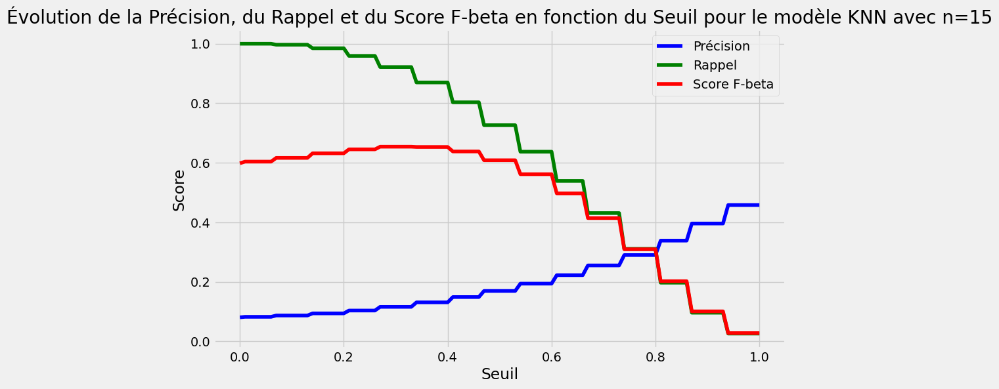

In [63]:
# Initialisez des listes vides pour stocker les valeurs de précision, de rappel et de score F-beta
precisions_knn = []
recalls_knn = []
f_betas_knn = []

for threshold in thresholds:
    y_pred_bin = (y_prob_knn[:, 1] >= threshold).astype(int)

    # Calculez la précision, le rappel et le score F-beta
    precision_knn = precision_score(y_train, y_pred_bin)
    recall_knn = recall_score(y_train, y_pred_bin)
    f_beta_knn = fbeta_score(y_train, y_pred_bin, beta=4)

    # Ajoutez les valeurs calculées aux listes
    precisions_knn.append(precision_knn)
    recalls_knn.append(recall_knn)
    f_betas_knn.append(f_beta_knn)

# Tracez les courbes
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions_knn, label='Précision', color='blue')
plt.plot(thresholds, recalls_knn, label='Rappel', color='green')
plt.plot(thresholds, f_betas_knn, label='Score F-beta', color='red')

plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Évolution de la Précision, du Rappel et du Score F-beta en fonction du Seuil pour le modèle KNN avec n=15')
plt.legend()
plt.grid(True)
plt.show()

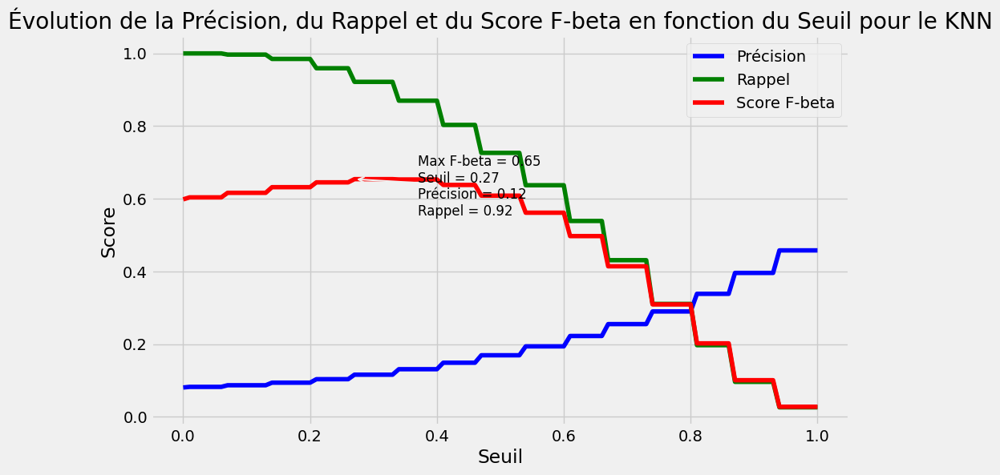

In [64]:
# Trouvez l'indice du maximum de f_betas
max_f_beta_idx_knn = np.argmax(f_betas_knn)

# Trouvez la valeur correspondante du seuil, de la précision et du rappel
best_threshold_knn = thresholds[max_f_beta_idx_knn]
best_precision_knn = precisions_knn[max_f_beta_idx_knn]
best_recall_knn = recalls_knn[max_f_beta_idx_knn]
best_f_beta_knn = f_betas_knn[max_f_beta_idx_knn]

# Tracez les courbes
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions_knn, label='Précision', color='blue')
plt.plot(thresholds, recalls_knn, label='Rappel', color='green')
plt.plot(thresholds, f_betas_knn, label='Score F-beta', color='red')

# Annoter le point où le score F-beta est maximal
plt.annotate(
    f'Max F-beta = {best_f_beta_knn:.2f}\nSeuil = {best_threshold_knn:.2f}\nPrécision = {best_precision_knn:.2f}\nRappel = {best_recall_knn:.2f}',
    xy=(best_threshold_knn, best_f_beta_knn),
    xytext=(best_threshold_knn + 0.1, best_f_beta_knn - 0.1),
    arrowprops=dict(arrowstyle='->', lw=1.5),
    fontsize=12,
    color='black',
)

plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Évolution de la Précision, du Rappel et du Score F-beta en fonction du Seuil pour le KNN')
plt.legend()
plt.grid(True)
plt.show()


In [65]:
from sklearn.metrics import confusion_matrix
y_pred_knn_thresholded = (y_prob_knn[:, 1] >= best_threshold_knn).astype(int)
confusion_knn = confusion_matrix(y_train, y_pred_knn_thresholded)
print('Matrice de confusion pour le KNN pour le meilleur seuil')
print(confusion_knn)

Matrice de confusion pour le KNN pour le meilleur seuil
[[ 75863 122052]
 [  1358  15984]]


# Algorithme Random Forest

1 - Trouver les bonnes valeurs des hyperparamètres pour optimiser f beta

In [66]:
from sklearn.ensemble import RandomForestClassifier

In [67]:




# Fixer les valeurs des hyperparamètres à tester
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20,30],
    # Ajoutez d'autres hyperparamètres du Random Forest ici
}


# Créer un modèle Random Forest avec recherche d'hyperparamètre par validation croisée
clf_rf = model_selection.GridSearchCV(
    RandomForestClassifier(),  # Modèle Random Forest
    param_grid_rf,  # hyperparamètres à tester
    cv=5,  # nombre de folds de validation croisée
    scoring=score2  # score à optimiser (F-beta)
)


clf_rf .fit(X_train_resampled, y_train_resampled)

# Afficher le(s) hyperparamètre(s) optimaux
print("Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement Random forest beta=4 :")
print(clf_rf.best_params_)

# Afficher les performances correspondantes
print("Résultats de la validation croisée :")
for mean, std, params in zip(
        clf_rf.cv_results_['mean_test_score'],  # score moyen
        clf_rf.cv_results_['std_test_score'],  # écart-type du score
        clf_rf.cv_results_['params']  # valeur de l'hyperparamètre
    ):
    print("{} = {:.3f} (+/-{:.03f}) for {}".format(
        score2,
        mean,
        std * 2,
        params
    ))


Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement Random forest beta=4 :
{'max_depth': 10, 'n_estimators': 300}
Résultats de la validation croisée :
make_scorer(fbeta_score, beta=4) = 0.696 (+/-0.017) for {'max_depth': 10, 'n_estimators': 100}
make_scorer(fbeta_score, beta=4) = 0.699 (+/-0.016) for {'max_depth': 10, 'n_estimators': 200}
make_scorer(fbeta_score, beta=4) = 0.699 (+/-0.015) for {'max_depth': 10, 'n_estimators': 300}
make_scorer(fbeta_score, beta=4) = 0.696 (+/-0.019) for {'max_depth': 20, 'n_estimators': 100}
make_scorer(fbeta_score, beta=4) = 0.697 (+/-0.011) for {'max_depth': 20, 'n_estimators': 200}
make_scorer(fbeta_score, beta=4) = 0.697 (+/-0.014) for {'max_depth': 20, 'n_estimators': 300}
make_scorer(fbeta_score, beta=4) = 0.688 (+/-0.014) for {'max_depth': 30, 'n_estimators': 100}
make_scorer(fbeta_score, beta=4) = 0.693 (+/-0.014) for {'max_depth': 30, 'n_estimators': 200}
make_scorer(fbeta_score, beta=4) = 0.696 (+/-0.011) for {'max_depth': 30, 'n_estimato

In [68]:
rf_model = RandomForestClassifier(n_estimators=300, max_depth=10)

# Ajuster le modèle aux données d'entraînement
rf_model.fit(X_train_resampled, y_train_resampled)

# Prédire les classes sur l'ensemble de test
y_pred_rf = rf_model.predict(X_train)

# Si vous souhaitez également obtenir les probabilités des classes
y_prob_rf = rf_model.predict_proba(X_train)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defin

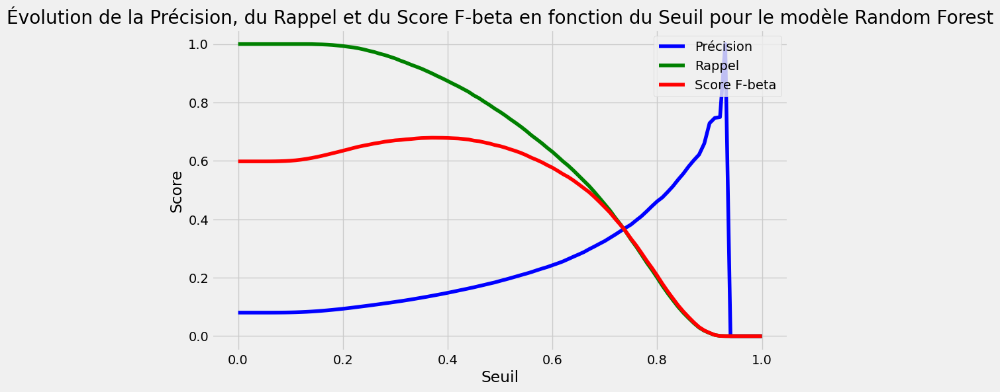

In [69]:
# Initialisez des listes vides pour stocker les valeurs de précision, de rappel et de score F-beta
precisions_rf = []
recalls_rf = []
f_betas_rf = []

for threshold in thresholds:
    y_pred_bin = (y_prob_rf[:, 1] >= threshold).astype(int)

    # Calculez la précision, le rappel et le score F-beta
    precision_rf = precision_score(y_train, y_pred_bin)
    recall_rf = recall_score(y_train, y_pred_bin)
    f_beta_rf = fbeta_score(y_train, y_pred_bin, beta=4)

    # Ajoutez les valeurs calculées aux listes
    precisions_rf.append(precision_rf)
    recalls_rf.append(recall_rf)
    f_betas_rf.append(f_beta_rf)

# Tracez les courbes
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions_rf, label='Précision', color='blue')
plt.plot(thresholds, recalls_rf, label='Rappel', color='green')
plt.plot(thresholds, f_betas_rf, label='Score F-beta', color='red')

plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Évolution de la Précision, du Rappel et du Score F-beta en fonction du Seuil pour le modèle Random Forest')
plt.legend()
plt.grid(True)
plt.show()

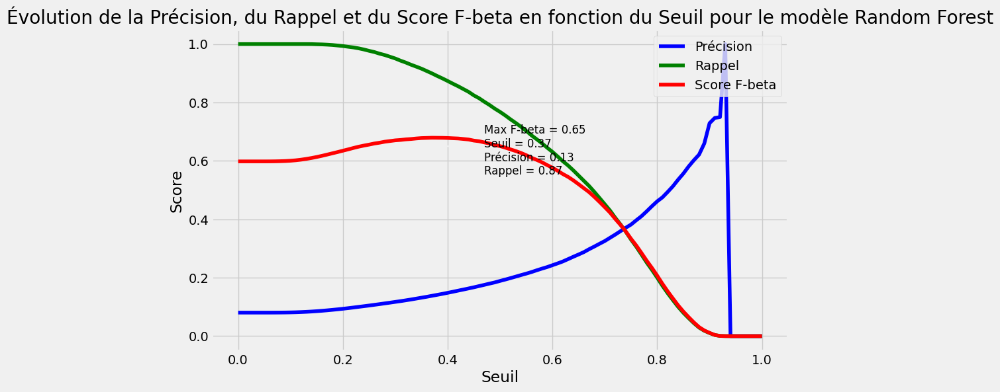

In [70]:
# Trouvez l'indice du maximum de f_betas
max_f_beta_idx_rf = np.argmax(f_betas_rf)

# Trouvez la valeur correspondante du seuil, de la précision et du rappel
best_threshold_rf = thresholds[max_f_beta_idx_rf]
best_precision_rf = precisions_knn[max_f_beta_idx_rf]
best_recall_rf = recalls_knn[max_f_beta_idx_rf]
best_f_beta_rf = f_betas_knn[max_f_beta_idx_rf]

# Tracez les courbes
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions_rf, label='Précision', color='blue')
plt.plot(thresholds, recalls_rf, label='Rappel', color='green')
plt.plot(thresholds, f_betas_rf, label='Score F-beta', color='red')

# Annoter le point où le score F-beta est maximal
plt.annotate(
    f'Max F-beta = {best_f_beta_rf:.2f}\nSeuil = {best_threshold_rf:.2f}\nPrécision = {best_precision_rf:.2f}\nRappel = {best_recall_rf:.2f}',
    xy=(best_threshold_rf, best_f_beta_rf),
    xytext=(best_threshold_rf + 0.1, best_f_beta_rf - 0.1),
    arrowprops=dict(arrowstyle='->', lw=1.5),
    fontsize=12,
    color='black',
)

plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Évolution de la Précision, du Rappel et du Score F-beta en fonction du Seuil pour le modèle Random Forest')
plt.legend()
plt.grid(True)
plt.show()


In [71]:
y_pred_rf_thresholded = (y_prob_rf[:, 1] >= best_threshold_rf).astype(int)
confusion_rf = confusion_matrix(y_train, y_pred_rf_thresholded)
print('Matrice de confusion pour le Random Forest pour le meilleur seuil')
print(confusion_rf)

Matrice de confusion pour le Random Forest pour le meilleur seuil
[[100548  97367]
 [  1741  15601]]


# Algorithme XGBoost

1 - Trouver les bonnes valeurs des hyperparamètres pour optimiser f beta

In [72]:
import xgboost as xgb

In [73]:
from sklearn.model_selection import GridSearchCV

# Fixer les valeurs des hyperparamètres à tester
param_grid_xgb = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
}



# Créer un modèle XGBoost avec recherche d'hyperparamètre par validation croisée
clf_xgb = GridSearchCV(
    xgb.XGBClassifier(),  # Modèle XGBoost
    param_grid_xgb,  # hyperparamètres à tester
    cv=5,  # nombre de folds de validation croisée
    scoring=score2  # score à optimiser (F-beta)
)

clf_xgb.fit(X_train_resampled, y_train_resampled)

# Afficher le(s) hyperparamètre(s) optimaux
print("Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement (XGB avec beta=4):")
print(clf_xgb.best_params_)

# Afficher les performances correspondantes
print("Résultats de la validation croisée (XGB avec beta=4):")
for mean, std, params in zip(
        clf_xgb.cv_results_['mean_test_score'],  # score moyen
        clf_xgb.cv_results_['std_test_score'],  # écart-type du score
        clf_xgb.cv_results_['params']  # valeur de l'hyperparamètre
    ):
    print("{} = {:.3f} (+/-{:.03f}) for {}".format(
        score2,
        mean,
        std * 2,
        params
    ))


Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement (XGB avec beta=4):
{'max_depth': None, 'n_estimators': 100}
Résultats de la validation croisée (XGB avec beta=4):
make_scorer(fbeta_score, beta=4) = 0.703 (+/-0.009) for {'max_depth': None, 'n_estimators': 50}
make_scorer(fbeta_score, beta=4) = 0.704 (+/-0.012) for {'max_depth': None, 'n_estimators': 100}
make_scorer(fbeta_score, beta=4) = 0.699 (+/-0.012) for {'max_depth': None, 'n_estimators': 200}
make_scorer(fbeta_score, beta=4) = 0.703 (+/-0.012) for {'max_depth': 5, 'n_estimators': 50}
make_scorer(fbeta_score, beta=4) = 0.702 (+/-0.012) for {'max_depth': 5, 'n_estimators': 100}
make_scorer(fbeta_score, beta=4) = 0.701 (+/-0.012) for {'max_depth': 5, 'n_estimators': 200}
make_scorer(fbeta_score, beta=4) = 0.696 (+/-0.010) for {'max_depth': 10, 'n_estimators': 50}
make_scorer(fbeta_score, beta=4) = 0.695 (+/-0.011) for {'max_depth': 10, 'n_estimators': 100}
make_scorer(fbeta_score, beta=4) = 0.692 (+/-0.013) for {'max_depth': 

In [74]:
# Créer un modèle XGBoost
xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=5, learning_rate=0.1 , random_state=42)

# Ajuster le modèle aux données d'entraînement
xgb_model.fit(X_train_resampled, y_train_resampled)

# Prédire les classes sur l'ensemble de test
y_pred_xgb = xgb_model.predict(X_train)

# Si vous souhaitez également obtenir les probabilités des classes
y_prob_xgb = xgb_model.predict_proba(X_train)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


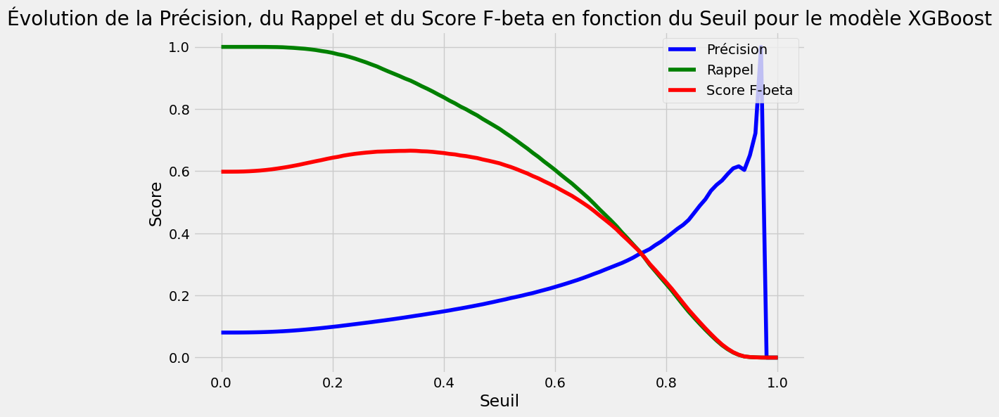

In [75]:
# Initialisez des listes vides pour stocker les valeurs de précision, de rappel et de score F-beta
precisions_xgb = []
recalls_xgb = []
f_betas_xgb = []

for threshold in thresholds:
    y_pred_bin = (y_prob_xgb[:, 1] >= threshold).astype(int)

    # Calculez la précision, le rappel et le score F-beta
    precision_xgb = precision_score(y_train, y_pred_bin)
    recall_xgb = recall_score(y_train, y_pred_bin)
    f_beta_xgb = fbeta_score(y_train, y_pred_bin, beta=4)

    # Ajoutez les valeurs calculées aux listes
    precisions_xgb.append(precision_xgb)
    recalls_xgb.append(recall_xgb)
    f_betas_xgb.append(f_beta_xgb)

# Tracez les courbes
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions_xgb, label='Précision', color='blue')
plt.plot(thresholds, recalls_xgb, label='Rappel', color='green')
plt.plot(thresholds, f_betas_xgb, label='Score F-beta', color='red')

plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Évolution de la Précision, du Rappel et du Score F-beta en fonction du Seuil pour le modèle XGBoost')
plt.legend()
plt.grid(True)
plt.show()

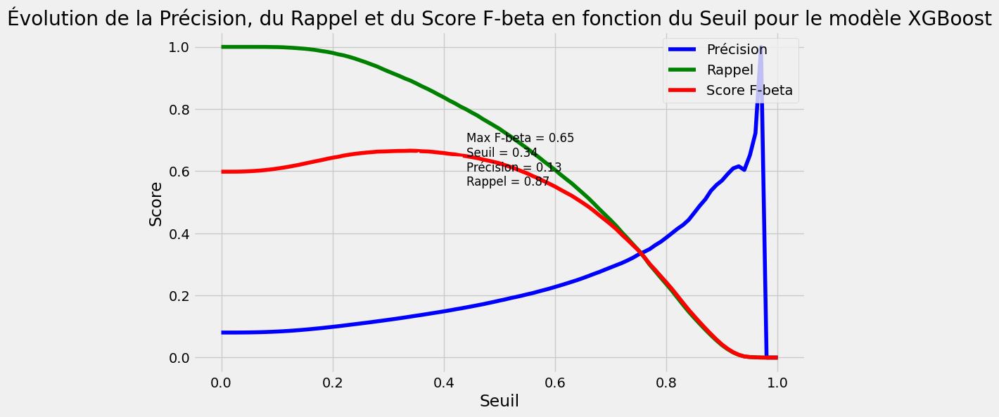

In [76]:
# Trouvez l'indice du maximum de f_betas
max_f_beta_idx_xgb = np.argmax(f_betas_xgb)

# Trouvez la valeur correspondante du seuil, de la précision et du rappel
best_threshold_xgb = thresholds[max_f_beta_idx_xgb]
best_precision_xgb = precisions_knn[max_f_beta_idx_xgb]
best_recall_xgb = recalls_knn[max_f_beta_idx_xgb]
best_f_beta_xgb = f_betas_knn[max_f_beta_idx_xgb]

# Tracez les courbes
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions_xgb, label='Précision', color='blue')
plt.plot(thresholds, recalls_xgb, label='Rappel', color='green')
plt.plot(thresholds, f_betas_xgb, label='Score F-beta', color='red')

# Annoter le point où le score F-beta est maximal
plt.annotate(
    f'Max F-beta = {best_f_beta_xgb:.2f}\nSeuil = {best_threshold_xgb:.2f}\nPrécision = {best_precision_xgb:.2f}\nRappel = {best_recall_xgb:.2f}',
    xy=(best_threshold_xgb, best_f_beta_xgb),
    xytext=(best_threshold_xgb + 0.1, best_f_beta_xgb - 0.1),
    arrowprops=dict(arrowstyle='->', lw=1.5),
    fontsize=12,
    color='black',
)

plt.xlabel('Seuil')
plt.ylabel('Score')
plt.title('Évolution de la Précision, du Rappel et du Score F-beta en fonction du Seuil pour le modèle XGBoost')
plt.legend()
plt.grid(True)
plt.show()


In [77]:
y_pred_xgb_thresholded = (y_prob_xgb[:, 1] >= best_threshold_xgb).astype(int)
confusion_xgb = confusion_matrix(y_train, y_pred_xgb_thresholded)
print('Matrice de confusion pour le XGB pour le meilleur seuil')
print(confusion_xgb)

Matrice de confusion pour le XGB pour le meilleur seuil
[[ 96163 101752]
 [  1882  15460]]


# Définition du seuil adéquat

In [78]:
y_pred_proba_logReg = logreg_model.predict_proba(X_train_resampled)[:, 1]
[fpr_logReg, tpr_logReg, thr_logReg] = metrics.roc_curve(y_train_resampled, y_pred_proba_logReg)
y_pred_proba_rf = rf_model.predict_proba(X_train_resampled)[:, 1]
[fpr_rf, tpr_rf, thr_rf] = metrics.roc_curve(y_train_resampled, y_pred_proba_rf)
y_pred_proba_xgb = xgb_model.predict_proba(X_train_resampled)[:, 1]
[fpr_xgb, tpr_xgb, thr_xgb] = metrics.roc_curve(y_train_resampled, y_pred_proba_xgb)

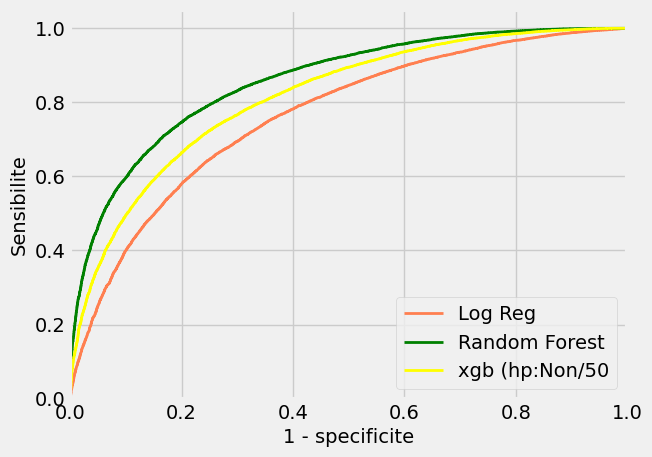

In [79]:
plt.plot(fpr_logReg, tpr_logReg, color=  "coral", lw=2, label='Log Reg')
plt.plot(fpr_rf, tpr_rf, color= "green", lw=2,label='Random Forest')
plt.plot(fpr_xgb, tpr_xgb, color="yellow", lw=2, label='xgb (hp:Non/50')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1 - specificite', fontsize=14)
plt.ylabel('Sensibilite', fontsize=14)
plt.legend()

plt.show()

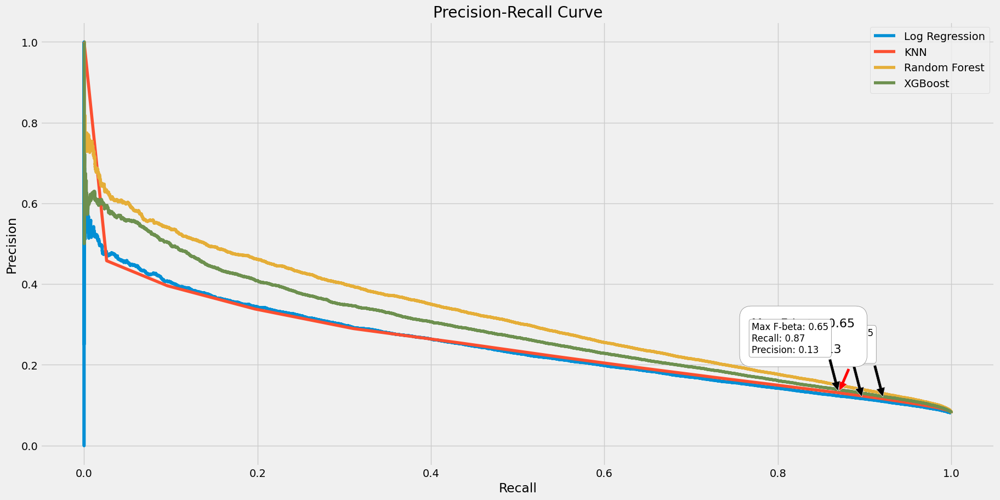

In [80]:

from sklearn.metrics import precision_recall_curve

plt.figure(figsize=(20, 10))
# Résultats de Regression logistique
precision_logReg, recall_logReg, _ = precision_recall_curve(y_train, y_prob_logreg[:, 1])
plt.plot(recall_logReg, precision_logReg, label='Log Regression')
plt.annotate(f'Max F-beta: {best_f_beta_reglog:.2f}\nRecall: {best_recall_reglog:.2f}\nPrecision: {best_precision_reglog:.2f}',
             xy=(best_recall_reglog, best_precision_reglog),
             xytext=(best_recall_reglog - 0.1, best_precision_reglog + 0.1),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=12,
             bbox=dict(boxstyle='round,pad=0.3', edgecolor='gray', facecolor='white'))

# Résultats de KNN
precision_knn, recall_knn, _ = precision_recall_curve(y_train, y_prob_knn[:, 1])
plt.plot(recall_knn, precision_knn, label='KNN')
plt.annotate(f'Max F-beta: {best_f_beta_knn:.2f}\nRecall: {best_recall_knn:.2f}\nPrecision: {best_precision_knn:.2f}',
             xy=(best_recall_knn, best_precision_knn),
             xytext=(best_recall_knn - 0.1, best_precision_knn + 0.1),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=12,
             bbox=dict(boxstyle='round,pad=0.3', edgecolor='gray', facecolor='white'))

# Résultats de Random Forest
precision_rf, recall_rf, _ = precision_recall_curve(y_train, y_prob_rf[:, 1])
plt.plot(recall_rf, precision_rf, label='Random Forest')
plt.annotate(f'Max F-beta: {best_f_beta_rf:.2f}\nRecall: {best_recall_rf:.2f}\nPrecision: {best_precision_rf:.2f}',
             xy=(best_recall_rf, best_precision_rf),
             xytext=(best_recall_rf - 0.1, best_precision_rf + 0.1),
             arrowprops=dict(facecolor='red', shrink=0.05),
             fontsize=16,
             bbox=dict(boxstyle='round,pad=1', edgecolor='gray', facecolor='white'))

# Résultats de XGBoost
precision_xgb, recall_xgb, _ = precision_recall_curve(y_train, y_prob_xgb[:, 1])
plt.plot(recall_xgb, precision_xgb, label='XGBoost')
plt.annotate(f'Max F-beta: {best_f_beta_xgb:.2f}\nRecall: {best_recall_xgb:.2f}\nPrecision: {best_precision_xgb:.2f}',
             xy=(best_recall_rf, best_precision_xgb),
             xytext=(best_recall_xgb - 0.1, best_precision_xgb + 0.1),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=12,
             bbox=dict(boxstyle='round,pad=0.3', edgecolor='gray', facecolor='white'))

# Ajouter des labels et une légende
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()

plt.show()


# Résumé

In [81]:
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score, roc_auc_score
# Make dataframes to plot

rf_df = pd.DataFrame(data=[f1_score(y_train,y_pred_rf_thresholded),accuracy_score(y_train,y_pred_rf_thresholded), recall_score(y_train,y_pred_rf_thresholded),
                   precision_score(y_train,y_pred_rf_thresholded), roc_auc_score(y_train,y_pred_rf_thresholded)],
             columns=['Random Forest Score'],
             index=["F1","Accuracy", "Recall", "Precision", "ROC AUC Score"])

xgb_df = pd.DataFrame(data=[f1_score(y_train,y_pred_xgb_thresholded),accuracy_score(y_train,y_pred_xgb_thresholded), recall_score(y_train,y_pred_xgb_thresholded),
                   precision_score(y_train,y_pred_xgb_thresholded), roc_auc_score(y_train,y_pred_xgb_thresholded)],
             columns=['XGB Score'],
             index=["F1","Accuracy", "Recall", "Precision", "ROC AUC Score"])

lr_df = pd.DataFrame(data=[f1_score(y_train,y_pred_logReg_thresholded),accuracy_score( y_train, y_pred_logReg_thresholded), recall_score( y_train, y_pred_logReg_thresholded),
                   precision_score(y_train, y_pred_logReg_thresholded), roc_auc_score( y_train, y_pred_logReg_thresholded)],
             columns=['Logistic Regression Score'],
             index=["F1","Accuracy", "Recall", "Precision", "ROC AUC Score"])

knn_df = pd.DataFrame(data=[f1_score(y_train,y_pred_knn_thresholded),accuracy_score( y_train, y_pred_knn_thresholded), recall_score( y_train, y_pred_knn_thresholded),
                   precision_score(y_train, y_pred_knn_thresholded), roc_auc_score( y_train, y_pred_knn_thresholded)],
             columns=['KNN Score'],
             index=["F1","Accuracy", "Recall", "Precision", "ROC AUC Score"])

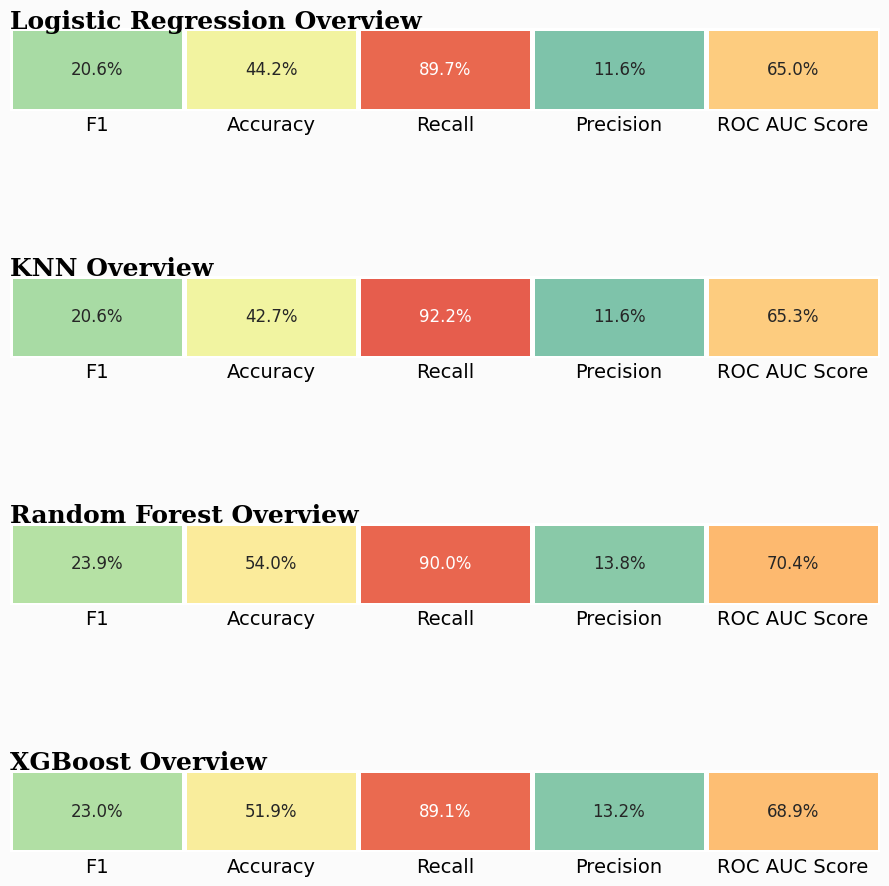

In [82]:
from matplotlib.colors import LinearSegmentedColormap  # Importez LinearSegmentedColormap depuis matplotlib.colors

# Plotting our results
gs = fig.add_gridspec(20, 2)
gs.update(wspace=0.1, hspace=0.5)
colors = ['#47a0b3', '#a2d9a4', '#edf8a3', '#fee999', '#fca55d', '#e2514a']
colormap = LinearSegmentedColormap.from_list("", colors)
background_color = "#fbfbfb"

fig = plt.figure(figsize=(10,30)) # create figure
ax0 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[2, :])
ax4 = fig.add_subplot(gs[4, :])
ax6 = fig.add_subplot(gs[6, :])



sns.heatmap(lr_df.T, cmap=colormap,annot=True,fmt=".1%",vmin=0,vmax=0.95,yticklabels='', linewidths=2.5,cbar=False,ax=ax0,annot_kws={"fontsize":12})
fig.patch.set_facecolor(background_color) # figure background color
sns.heatmap(knn_df.T, cmap=colormap,annot=True,fmt=".1%",vmin=0,vmax=0.95,yticklabels='', linewidths=2.5,cbar=False,ax=ax2,annot_kws={"fontsize":12})
fig.patch.set_facecolor(background_color) # figure background color
sns.heatmap(rf_df.T, cmap=colormap,annot=True,fmt=".1%",vmin=0,vmax=0.95,yticklabels='', linewidths=2.5,cbar=False,ax=ax4,annot_kws={"fontsize":12})
fig.patch.set_facecolor(background_color) # figure background color
sns.heatmap(xgb_df.T, cmap=colormap,annot=True,fmt=".1%",vmin=0,vmax=0.95,yticklabels='', linewidths=2.5,cbar=False,ax=ax6,annot_kws={"fontsize":12})
fig.patch.set_facecolor(background_color) # figure background color
ax0.set_facecolor(background_color)

ax0.text(0,0,'Logistic Regression Overview',fontsize=18,fontweight='bold',fontfamily='serif')
ax2.text(0,0,'KNN Overview',fontsize=18,fontweight='bold',fontfamily='serif')
ax2.tick_params(axis=u'both', which=u'both',length=0)
ax0.tick_params(axis=u'both', which=u'both',length=0)
ax4.text(0,0,'Random Forest Overview',fontsize=18,fontweight='bold',fontfamily='serif')
ax6.text(0,0,'XGBoost Overview',fontsize=18,fontweight='bold',fontfamily='serif')
ax4.tick_params(axis=u'both', which=u'both',length=0)
ax6.tick_params(axis=u'both', which=u'both',length=0)


plt.show()

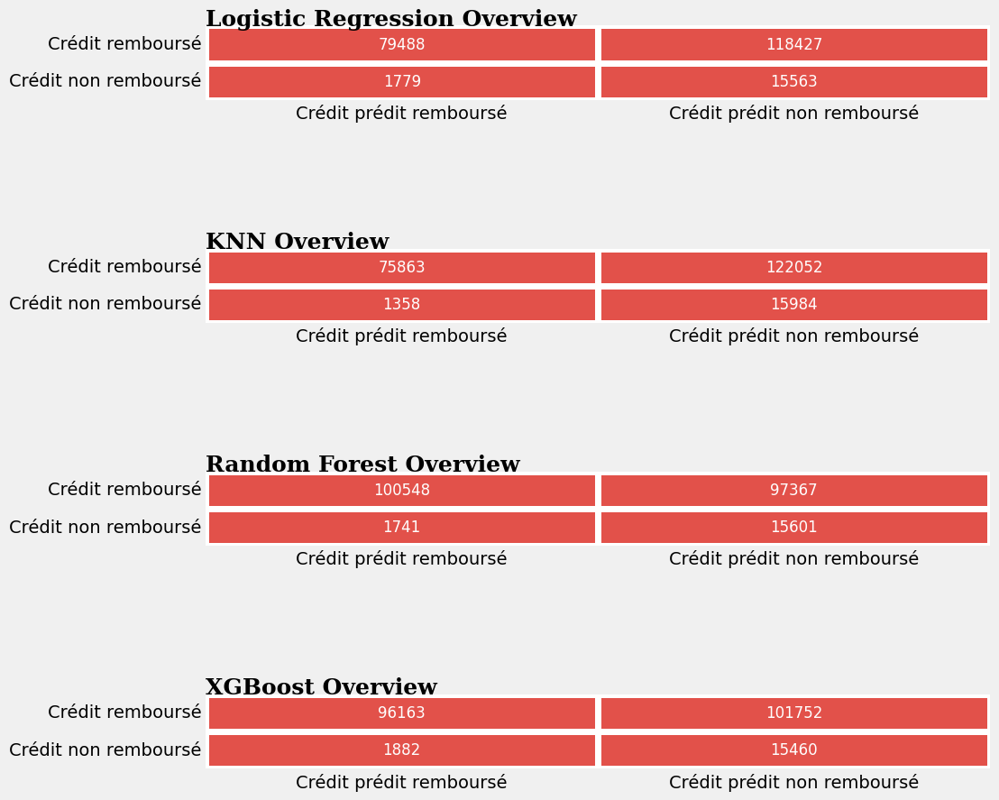

In [83]:

background_color = "#fbfbfb"
colors = ['#47a0b3', '#a2d9a4', '#edf8a3', '#fee999', '#fca55d', '#e2514a']
colormap = LinearSegmentedColormap.from_list("", colors)


fig = plt.figure(figsize=(10,30)) # create figure
ax0 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[2, :])
ax4 = fig.add_subplot(gs[4, :])
ax6 = fig.add_subplot(gs[6, :])

ax0.text(0,0,'Logistic Regression Overview',fontsize=18,fontweight='bold',fontfamily='serif')
ax2.text(0,0,'KNN Overview',fontsize=18,fontweight='bold',fontfamily='serif')
ax4.text(0,0,'Random Forest Overview',fontsize=18,fontweight='bold',fontfamily='serif')
ax6.text(0,0,'XGBoost Overview',fontsize=18,fontweight='bold',fontfamily='serif')


# Overall

sns.heatmap(confusion_logReg, cmap=colors,annot=True,fmt="d", linewidths=5,cbar=False,ax=ax0,
            yticklabels=['Crédit remboursé','Crédit non remboursé'],vmax=500,vmin=0,xticklabels=['Crédit prédit remboursé','Crédit prédit non remboursé'],annot_kws={"fontsize":12})
sns.heatmap(confusion_knn, cmap=colormap,annot=True,fmt="d", linewidths=5,cbar=False,ax=ax2,
            yticklabels=['Crédit remboursé','Crédit non remboursé'],vmax=500,vmin=0,xticklabels=['Crédit prédit remboursé','Crédit prédit non remboursé'],annot_kws={"fontsize":12})
sns.heatmap(confusion_rf, cmap=colormap,annot=True,fmt="d", linewidths=5,cbar=False,ax=ax4,
            yticklabels=['Crédit remboursé','Crédit non remboursé'],vmax=500,vmin=0,xticklabels=['Crédit prédit remboursé','Crédit prédit non remboursé'],annot_kws={"fontsize":12})
sns.heatmap(confusion_xgb, cmap=colormap,annot=True,fmt="d", linewidths=5,cbar=False,ax=ax6,
            yticklabels=['Crédit remboursé','Crédit non remboursé'],vmax=500,vmin=0,xticklabels=['Crédit prédit remboursé','Crédit prédit non remboursé'],annot_kws={"fontsize":12})

plt.show()

#  Explicabilité

##  RF

In [84]:
# Créez un DataFrame contenant les données de l'individu que vous voulez expliquer
individu = application_train_short.iloc[0]  # Remplacez par l'individu que vous souhaitez expliquer
individu_df = pd.DataFrame([individu], columns=application_train_short.columns)
individu_df = individu_df.drop(columns=["TARGET"])

In [85]:
feature_importance_rf = rf_model.feature_importances_

In [86]:
feature_names = application_train_short_imputed_knn.columns[1:]

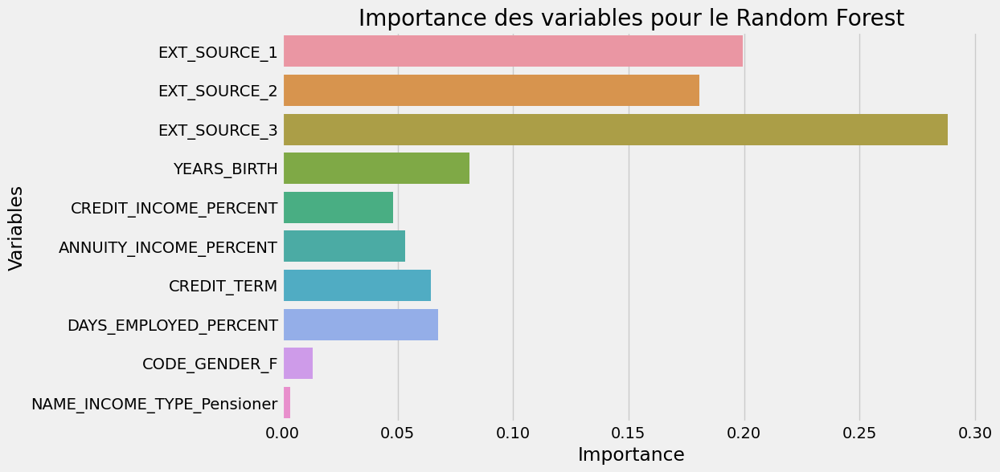

In [87]:
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que 'feature_importance' contient les valeurs d'importance des variables
# et 'feature_names' contient les noms des variables

# Créez une figure
plt.figure(figsize=(10, 6))

# Tracer un graphique à barres horizontales pour afficher l'importance des variables
sns.barplot(x=feature_importance_rf, y=feature_names)

# Ajoutez un titre et des étiquettes d'axe
plt.title('Importance des variables pour le Random Forest')
plt.xlabel('Importance')
plt.ylabel('Variables')

# Afficher le graphique
plt.show()

In [88]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 12.2 MB/s eta 0:00:00


In [89]:
import shap

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [90]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=4c19c2e0f98668916bb44198e9cc5e82f09e3f631a330b844001bd379bb44cae
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [91]:
import lime
from lime.lime_tabular import LimeTabularExplainer

In [92]:
# Créez un explainer LIME
explainer_rf_lime = lime.lime_tabular.LimeTabularExplainer(X_test, class_names=['Remboursera', 'Ne remboursera pas'], feature_names = feature_names, kernel_width=3, verbose=False)

In [94]:
sample_index = 0  # L'index de l'échantillon que vous souhaitez expliquer
sample = X_test[sample_index]

In [96]:
print(y_test[sample_index])

0.0


In [97]:
explanation_rf_lime = explainer_rf_lime.explain_instance(sample, rf_model.predict_proba, num_features=20 )

In [98]:
explanation_rf_lime.show_in_notebook()

In [107]:
explanation_rf_lime.as_html()

'<html>\n        <meta http-equiv="content-type" content="text/html; charset=UTF8">\n        <head><script>var lime =\n/******/ (function(modules) { // webpackBootstrap\n/******/ \t// The module cache\n/******/ \tvar installedModules = {};\n/******/\n/******/ \t// The require function\n/******/ \tfunction __webpack_require__(moduleId) {\n/******/\n/******/ \t\t// Check if module is in cache\n/******/ \t\tif(installedModules[moduleId])\n/******/ \t\t\treturn installedModules[moduleId].exports;\n/******/\n/******/ \t\t// Create a new module (and put it into the cache)\n/******/ \t\tvar module = installedModules[moduleId] = {\n/******/ \t\t\texports: {},\n/******/ \t\t\tid: moduleId,\n/******/ \t\t\tloaded: false\n/******/ \t\t};\n/******/\n/******/ \t\t// Execute the module function\n/******/ \t\tmodules[moduleId].call(module.exports, module, module.exports, __webpack_require__);\n/******/\n/******/ \t\t// Flag the module as loaded\n/******/ \t\tmodule.loaded = true;\n/******/\n/******/ 

##  XGB

In [108]:
feature_importance_xgb = xgb_model.feature_importances_

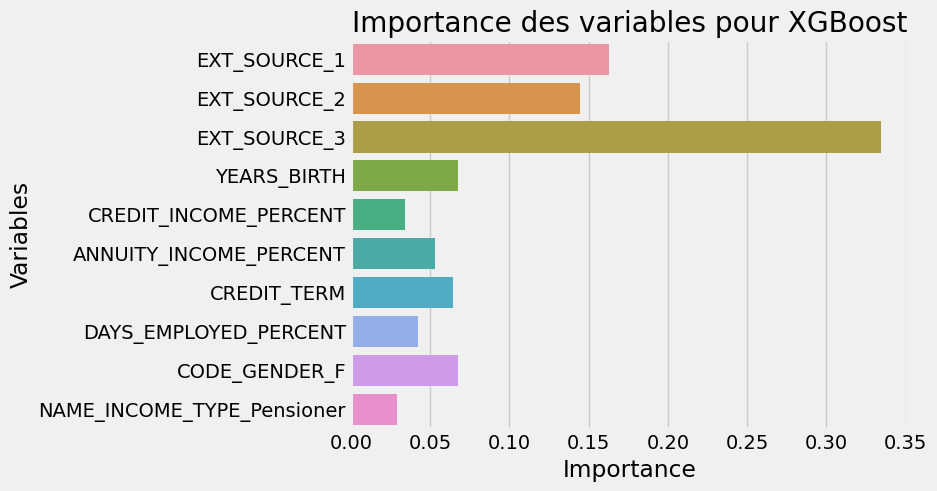

In [109]:
# Tracer un graphique à barres horizontales pour afficher l'importance des variables
sns.barplot(x=feature_importance_xgb, y=feature_names)
# Ajoutez un titre et des étiquettes d'axe
plt.title('Importance des variables pour XGBoost')
plt.xlabel('Importance')
plt.ylabel('Variables')

# Afficher le graphique
plt.show()

In [110]:
# Créez un explainer LIME
explainer_xgb_lime = lime.lime_tabular.LimeTabularExplainer(X_test, class_names=['Remboursera', 'Ne remboursera pas'], feature_names = feature_names, kernel_width=3, verbose=False)

In [111]:
explanation_xgb_lime = explainer_xgb_lime.explain_instance(sample, xgb_model.predict_proba, num_features=20 )

In [112]:
explanation_xgb_lime.show_in_notebook()

In [113]:
explanation_xgb_lime.as_html()

'<html>\n        <meta http-equiv="content-type" content="text/html; charset=UTF8">\n        <head><script>var lime =\n/******/ (function(modules) { // webpackBootstrap\n/******/ \t// The module cache\n/******/ \tvar installedModules = {};\n/******/\n/******/ \t// The require function\n/******/ \tfunction __webpack_require__(moduleId) {\n/******/\n/******/ \t\t// Check if module is in cache\n/******/ \t\tif(installedModules[moduleId])\n/******/ \t\t\treturn installedModules[moduleId].exports;\n/******/\n/******/ \t\t// Create a new module (and put it into the cache)\n/******/ \t\tvar module = installedModules[moduleId] = {\n/******/ \t\t\texports: {},\n/******/ \t\t\tid: moduleId,\n/******/ \t\t\tloaded: false\n/******/ \t\t};\n/******/\n/******/ \t\t// Execute the module function\n/******/ \t\tmodules[moduleId].call(module.exports, module, module.exports, __webpack_require__);\n/******/\n/******/ \t\t// Flag the module as loaded\n/******/ \t\tmodule.loaded = true;\n/******/\n/******/ 

SHAP Values: .values =
array([[ 0.04670648,  0.0094431 , -0.18900194,  1.04163658,  0.09626798,
        -0.01759246,  0.56440286, -0.07045546, -0.00156332, -0.00242538]])

.base_values =
array([-0.36681107])

.data =
array([[ 0.08303697,  0.26294859,  0.13937578, 25.92054795,  2.00788889,
         0.12197778, 16.46110403,  0.06732903,  0.        ,  0.        ]])


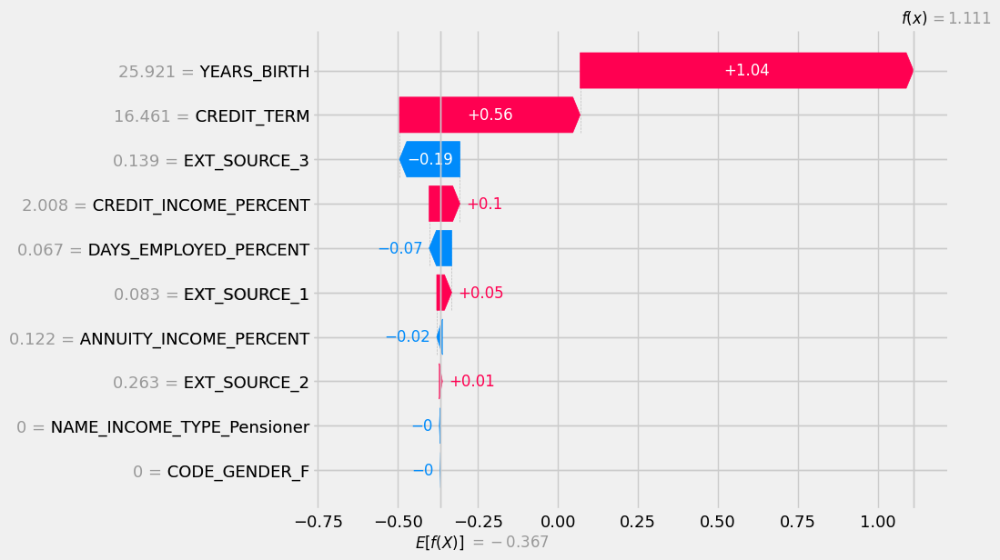

In [114]:
# Créez un explainer SHAP en utilisant votre modèle formé
explainer_xgb = shap.Explainer(xgb_model, X_test)

# Expliquez la prédiction pour cet individu
shap_values_xgb = explainer_xgb(individu_df)

# Obtenez les valeurs SHAP pour l'individu
print("SHAP Values:", shap_values_xgb)

# Affichez les valeurs SHAP
shap.plots.waterfall(shap_values_xgb[0])

##  Log Reg

In [115]:
coefficients_logreg = logreg_model.coef_[0]

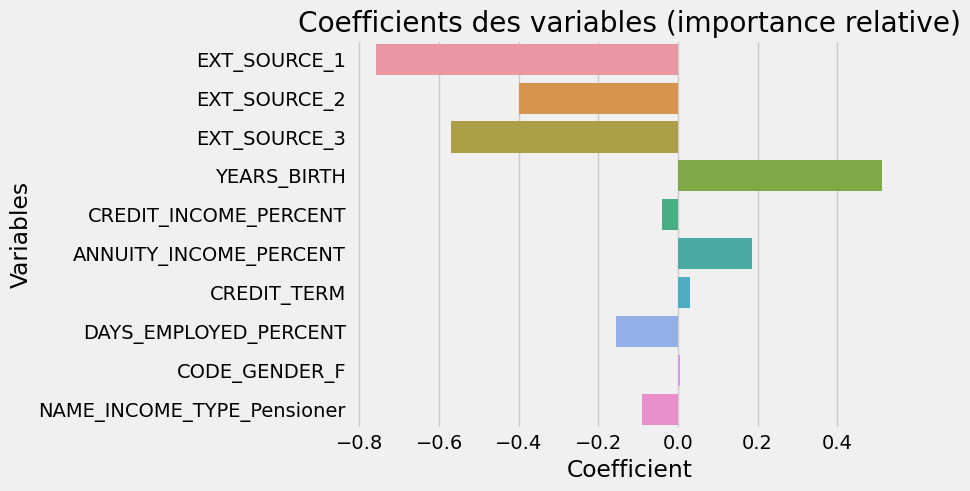

In [116]:
# Tracer un graphique à barres horizontales pour afficher les coefficients des variables
sns.barplot(x=coefficients_logreg, y=feature_names)

# Ajoutez un titre et des étiquettes d'axe
plt.title('Coefficients des variables (importance relative)')
plt.xlabel('Coefficient')
plt.ylabel('Variables')

# Afficher le graphique
plt.show()

In [117]:
# Créez un explainer LIME
explainer_logreg_lime = lime.lime_tabular.LimeTabularExplainer(X_test, class_names=['Remboursera', 'Ne remboursera pas'], feature_names = feature_names, kernel_width=3, verbose=False)

In [118]:
explanation_logreg_lime = explainer_logreg_lime.explain_instance(sample, logreg_model.predict_proba, num_features=20 )

In [119]:
explanation_logreg_lime.show_in_notebook()

In [120]:
explanation_logreg_lime.as_html()

'<html>\n        <meta http-equiv="content-type" content="text/html; charset=UTF8">\n        <head><script>var lime =\n/******/ (function(modules) { // webpackBootstrap\n/******/ \t// The module cache\n/******/ \tvar installedModules = {};\n/******/\n/******/ \t// The require function\n/******/ \tfunction __webpack_require__(moduleId) {\n/******/\n/******/ \t\t// Check if module is in cache\n/******/ \t\tif(installedModules[moduleId])\n/******/ \t\t\treturn installedModules[moduleId].exports;\n/******/\n/******/ \t\t// Create a new module (and put it into the cache)\n/******/ \t\tvar module = installedModules[moduleId] = {\n/******/ \t\t\texports: {},\n/******/ \t\t\tid: moduleId,\n/******/ \t\t\tloaded: false\n/******/ \t\t};\n/******/\n/******/ \t\t// Execute the module function\n/******/ \t\tmodules[moduleId].call(module.exports, module, module.exports, __webpack_require__);\n/******/\n/******/ \t\t// Flag the module as loaded\n/******/ \t\tmodule.loaded = true;\n/******/\n/******/ 

SHAP Values: .values =
array([[-1.65990956e-01, -1.27322059e-01, -8.13488853e-02,
         1.33046689e+01, -8.02763020e-02,  8.16827004e-03,
         5.05942883e-01, -2.42117805e-02,  8.34685635e-05,
        -1.16191528e-02]])

.base_values =
array([-0.24802424])

.data =
array([[ 0.08303697,  0.26294859,  0.13937578, 25.92054795,  2.00788889,
         0.12197778, 16.46110403,  0.06732903,  0.        ,  0.        ]])


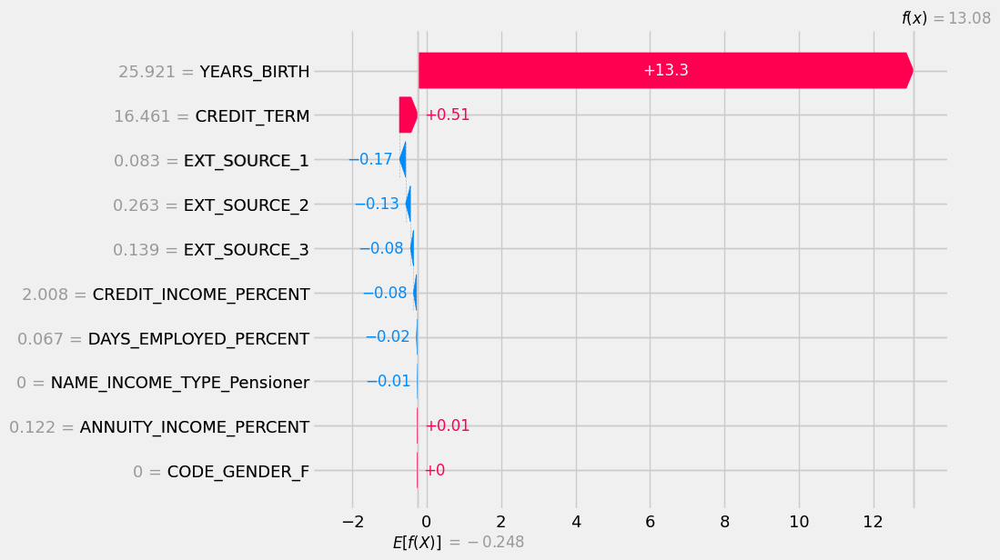

In [121]:
# Créez un explainer SHAP en utilisant votre modèle formé
explainer_logreg = shap.Explainer(logreg_model, X_test)

# Expliquez la prédiction pour cet individu
shap_values_logreg = explainer_logreg(individu_df)

# Obtenez les valeurs SHAP pour l'individu
print("SHAP Values:", shap_values_logreg)

# Affichez les valeurs SHAP
shap.plots.waterfall(shap_values_logreg[0])



# KNN

Exact explainer: 2it [00:51, 51.18s/it]               


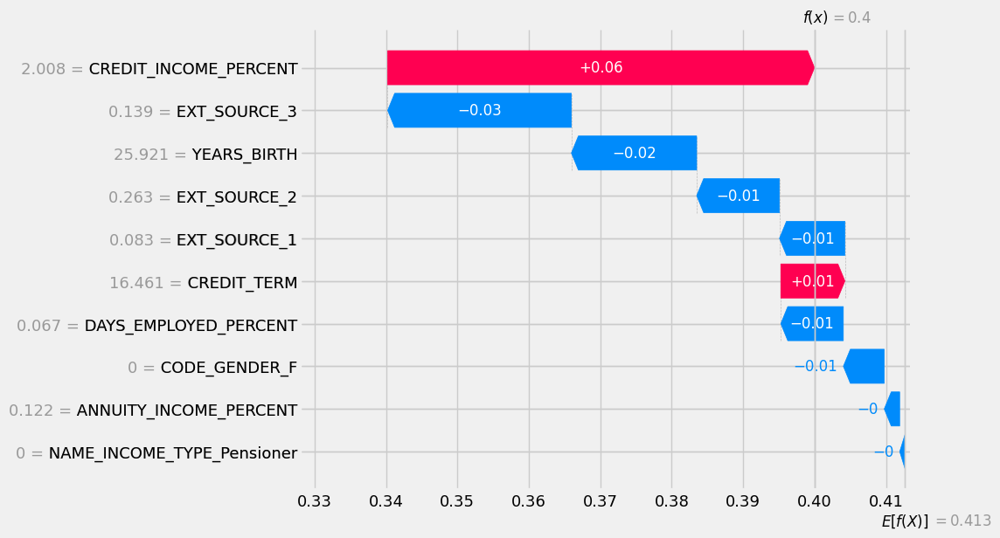

In [ ]:
def knn_predict(X):
    return knn_classifier.predict_proba(X)[:, 1]

# Créez un explainer SHAP en utilisant la fonction predict du modèle
explainer_knn = shap.Explainer(knn_predict, X_test)

# Expliquez la prédiction pour un individu (remplacez individu_df par vos données)
shap_values_knn = explainer_knn(individu_df)

# Affichez les valeurs SHAP
shap.plots.waterfall(shap_values_knn[0])